# Stock Price Prediction Using RNNs

## Objective
The objective of this assignment is to try and predict the stock prices using historical data from four companies IBM (IBM), Google (GOOGL), Amazon (AMZN), and Microsoft (MSFT).

We use four different companies because they belong to the same sector: Technology. Using data from all four companies may improve the performance of the model. This way, we can capture the broader market sentiment.

The problem statement for this assignment can be summarised as follows:

> Given the stock prices of Amazon, Google, IBM, and Microsoft for a set number of days, predict the stock price of these companies after that window.

## Business Value

Data related to stock markets lends itself well to modeling using RNNs due to its sequential nature. We can keep track of opening prices, closing prices, highest prices, and so on for a long period of time as these values are generated every working day. The patterns observed in this data can then be used to predict the future direction in which stock prices are expected to move. Analyzing this data can be interesting in itself, but it also has a financial incentive as accurate predictions can lead to massive profits.

### **Data Description**

You have been provided with four CSV files corresponding to four stocks: AMZN, GOOGL, IBM, and MSFT. The files contain historical data that were gathered from the websites of the stock markets where these companies are listed: NYSE and NASDAQ. The columns in all four files are identical. Let's take a look at them:

- `Date`: The values in this column specify the date on which the values were recorded. In all four files, the dates range from Jaunary 1, 2006 to January 1, 2018.

- `Open`: The values in this column specify the stock price on a given date when the stock market opens.

- `High`: The values in this column specify the highest stock price achieved by a stock on a given date.

- `Low`: The values in this column specify the lowest stock price achieved by a stock on a given date.

- `Close`: The values in this column specify the stock price on a given date when the stock market closes.

- `Volume`: The values in this column specify the total number of shares traded on a given date.

- `Name`: This column gives the official name of the stock as used in the stock market.

There are 3019 records in each data set. The file names are of the format `\<company_name>_stock_data.csv`.

## **1 Data Loading and Preparation** <font color =red> [25 marks] </font>

#### **Import Necessary Libraries**

In [7]:
# Import libraries
import os
import re
import random
import sys
import io

import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import Sequential, Input, Model
from tensorflow.keras.layers import Embedding, Dense, TimeDistributed, LSTM, GRU, Bidirectional, SimpleRNN, RNN, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from keras.layers import TextVectorization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import get_file

from sklearn.model_selection import ParameterGrid, TimeSeriesSplit
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2
from sklearn.metrics import mean_squared_error, accuracy_score, r2_score
from hyperopt import fmin, tpe, hp, Trials
import random
from functools import partial

### **1.1 Data Aggregation** <font color =red> [7 marks] </font>

As we are using the stock data for four different companies, we need to create a new DataFrame that contains the combined data from all four data frames. We will create a function that takes in a list of the file names for the four CSV files, and returns a single data frame. This function performs the following tasks:
- Extract stock names from file names
- Read the CSV files as data frames
- Append the stock names into the columns of their respective data frames
- Drop unnecessary columns
- Join the data frames into one.

#### **1.1.1** <font color =red> [5 marks] </font>
Create the function to join DataFrames and use it to combine the four datasets.

In [11]:
# Define a function to load data and aggregate them

def load_and_agg_data(file_list):
    """
    Loads multiple CSV files, and merges them into a single DataFrame.

    Arguments:
        file_names: A list of CSV file names.

    Returns:
        pandas.DataFrame: The merged DataFrame, or None if no files are processed.
    """
    if not file_list:
        print("Error: No file names provided.")
        return None

    dataframes = []
    for file_name in file_list:

        # Pass the file_name
        df = pd.read_csv(file_name)

        # Replace empty strings with NaN
        df = df.replace(r'^\s*$', np.nan, regex=True)

        # Convert 'Date' to datetime before any operations
        df['Date'] = pd.to_datetime(df['Date'])

        base_name = df.loc[0, 'Name']

        # Drop the 'Name' column
        df = df.drop(columns=['Name'], axis = 1, errors='ignore')

        # Modify column names to represent the Company

        new_columns = {
            'Date': 'Date',
            'Open': f'Open_{base_name}',
            'High': f'High_{base_name}',
            'Low': f'Low_{base_name}',
            'Close': f'Close_{base_name}',
            'Volume': f'Volume_{base_name}',
        }
        df = df.rename(columns=new_columns)
        dataframes.append(df)

    # Merge the DataFrames
    if not dataframes:
        print("No dataframes to merge")
        return None
    final_df = dataframes[0]
    for i in range(1, len(dataframes)):
        final_df = final_df.merge(dataframes[i], on='Date', how='inner')
    return final_df


In [12]:
# Specify the names of the raw data files to be read and use the aggregation function to read the files

files = []
files.append('AMZN_stocks_data.csv')
files.append('GOOGL_stocks_data.csv')
files.append('IBM_stocks_data.csv')
files.append('MSFT_stocks_data.csv')

df = load_and_agg_data(files)

In [13]:
# View specifics of the data

print('Shape of the dataframe is', df.shape)
df.head()

Shape of the dataframe is (3019, 21)


,Date,Open_AMZN,High_AMZN,Low_AMZN,Close_AMZN,Volume_AMZN,Open_GOOGL,High_GOOGL,Low_GOOGL,Close_GOOGL,...,Open_IBM,High_IBM,Low_IBM,Close_IBM,Volume_IBM,Open_MSFT,High_MSFT,Low_MSFT,Close_MSFT,Volume_MSFT
0,2006-01-03,47.47,47.85,46.25,47.58,7582127,211.47,218.05,209.32,217.83,...,82.45,82.55,80.81,82.06,11715200,26.25,27.00,26.10,26.84,79974418
1,2006-01-04,47.48,47.73,46.69,47.25,7440914,222.17,224.70,220.09,222.84,...,82.20,82.50,81.33,81.95,9840600,26.77,27.08,26.77,26.97,57975661
2,2006-01-05,47.16,48.20,47.11,47.65,5417258,223.22,226.00,220.97,225.85,...,81.40,82.90,81.00,82.50,7213500,26.96,27.13,26.91,26.99,48247610
3,2006-01-06,47.97,48.58,47.32,47.87,6154285,228.66,235.49,226.85,233.06,...,83.95,85.03,83.41,84.95,8197400,26.89,27.00,26.49,26.91,100969092
4,2006-01-09,46.55,47.10,46.40,47.08,8945056,233.44,236.94,230.70,233.68,...,84.10,84.25,83.38,83.73,6858200,26.93,27.07,26.76,26.86,55627836


#### **1.1.2** <font color =red> [2 marks] </font>
Identify and handle any missing values.

In [15]:
df.describe()

,Date,Open_AMZN,High_AMZN,Low_AMZN,Close_AMZN,Volume_AMZN,Open_GOOGL,High_GOOGL,Low_GOOGL,Close_GOOGL,...,Open_IBM,High_IBM,Low_IBM,Close_IBM,Volume_IBM,Open_MSFT,High_MSFT,Low_MSFT,Close_MSFT,Volume_MSFT
count,3019,3019.000000,3019.000000,3019.000000,3019.000000,3.019000e+03,3019.000000,3019.000000,3019.000000,3019.000000,...,3018.000000,3019.000000,3018.000000,3019.000000,3.019000e+03,3019.000000,3019.000000,3019.000000,3019.000000,3.019000e+03
mean,2012-01-01 20:00:33.388539392,299.335310,302.371163,296.037695,299.376231,5.931712e+06,428.200802,431.835618,424.130275,428.044001,...,145.521034,146.687493,144.477203,145.623031,5.773563e+06,36.496817,36.827903,36.173190,36.513412,5.161762e+07
min,2006-01-03 00:00:00,26.090000,26.300000,25.760000,26.070000,9.864350e+05,131.390000,134.820000,123.770000,128.850000,...,72.740000,73.940000,69.500000,71.740000,2.542560e+05,15.200000,15.620000,14.870000,15.150000,7.425603e+06
25%,2009-01-01 00:00:00,81.175000,82.580000,79.725000,81.090000,3.137037e+06,247.775000,250.190000,244.035000,247.605000,...,116.402500,117.750000,115.480000,116.520000,3.622178e+06,26.785000,27.045000,26.535000,26.835000,3.136557e+07
50%,2011-12-30 00:00:00,205.330000,208.000000,202.100000,205.440000,4.724100e+06,310.480000,312.810000,307.790000,310.080000,...,149.650000,150.410000,148.480000,149.330000,4.926500e+06,29.990000,30.230000,29.780000,30.000000,4.617529e+07
75%,2015-01-01 00:00:00,375.570000,379.155000,373.000000,375.140000,7.135246e+06,572.140000,575.975000,565.900000,570.770000,...,178.452500,179.775000,177.340000,178.690000,6.966642e+06,44.545000,44.980000,44.090000,44.400000,6.322291e+07
max,2017-12-29 00:00:00,1204.880000,1213.410000,1191.150000,1195.830000,1.044046e+08,1083.020000,1086.490000,1072.270000,1085.090000,...,215.380000,215.900000,214.300000,215.800000,3.077428e+07,87.120000,87.500000,86.230000,86.850000,5.910786e+08
std,NaN,280.120547,281.826442,277.927134,279.980161,5.122034e+06,236.320026,237.514087,234.923747,236.343238,...,37.559958,37.618348,37.482585,37.534272,3.193327e+06,14.683337,14.742483,14.620057,14.694656,3.114958e+07


In [16]:
# Checking Missing Values

null = round(100*df.isnull().sum(),2)/df.shape[0]
print(null)

Date            0.000000
Open_AMZN       0.000000
High_AMZN       0.000000
Low_AMZN        0.000000
Close_AMZN      0.000000
Volume_AMZN     0.000000
Open_GOOGL      0.000000
High_GOOGL      0.000000
Low_GOOGL       0.000000
Close_GOOGL     0.000000
Volume_GOOGL    0.000000
Open_IBM        0.033124
High_IBM        0.000000
Low_IBM         0.033124
Close_IBM       0.000000
Volume_IBM      0.000000
Open_MSFT       0.000000
High_MSFT       0.000000
Low_MSFT        0.000000
Close_MSFT      0.000000
Volume_MSFT     0.000000
dtype: float64


#### <font color = 'Red'> As we can see null values are less than 0.03% so will just drop null values

In [18]:
df = df.dropna()
null = round(100*df.isnull().sum(),2)/df.shape[0]
print(null)

Date            0.0
Open_AMZN       0.0
High_AMZN       0.0
Low_AMZN        0.0
Close_AMZN      0.0
Volume_AMZN     0.0
Open_GOOGL      0.0
High_GOOGL      0.0
Low_GOOGL       0.0
Close_GOOGL     0.0
Volume_GOOGL    0.0
Open_IBM        0.0
High_IBM        0.0
Low_IBM         0.0
Close_IBM       0.0
Volume_IBM      0.0
Open_MSFT       0.0
High_MSFT       0.0
Low_MSFT        0.0
Close_MSFT      0.0
Volume_MSFT     0.0
dtype: float64


### **1.2 Analysis and Visualisation** <font color =red> [5 marks] </font>

#### **1.2.1** <font color =red> [2 marks] </font>
Analyse the frequency distribution of stock volumes of the companies and also see how the volumes vary over time.

#### <font color = 'Red'>At first, we would plot the frequency distribution of the total volume (That is, we would melt all the volumes in one)

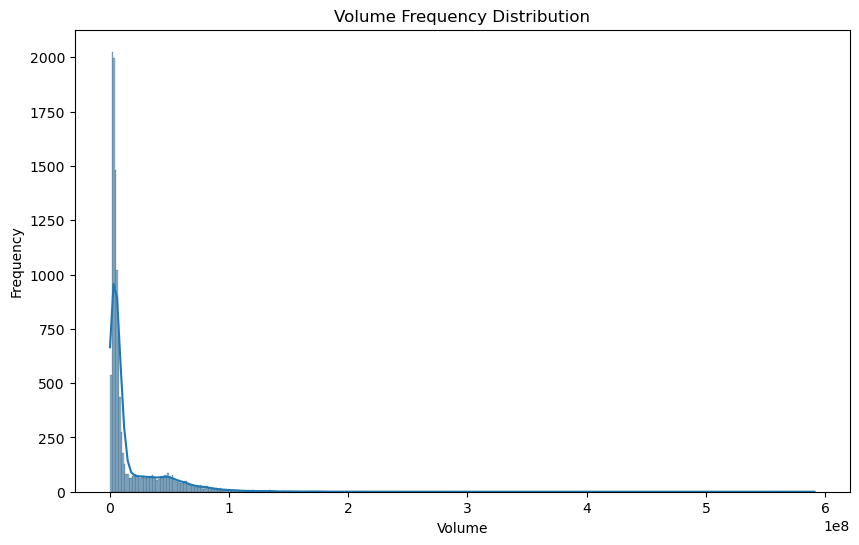

In [22]:
# Frequency distribution of volumes

# Frequency distribution of volumes

def plot_volume_freq_distribution(df):
    """
    Plots the frequency distribution of volume data from a DataFrame.
    
    """
    # Extract Volume Columns
    volume_cols = [col for col in df.columns if col.startswith('Volume_')]
    if not volume_cols:
        print("Error: No volume columns found in the DataFrame.")
        return

    # Create a DataFrame for Plotting
    # We can 'Melt' the DataFrame to combine all volume columns into one for plotting
    volume_df = df[volume_cols].melt(var_name='Volume_Source', value_name='Volume')

    # Plotting the Distribution
    plt.figure(figsize=(10, 6))
    sns.histplot(volume_df['Volume'], kde=True)  # Using histplot for distribution, and including KDE
    plt.title('Volume Frequency Distribution')
    plt.xlabel('Volume')
    plt.ylabel('Frequency')
    plt.show()

if df is not None:
    plot_volume_freq_distribution(df)
else:
    print("No data to plot.  Please ensure data is loaded correctly.")

#### <font color = 'Brown'> The 'melted' frequency distribution is right-skewed i.e. positive skew.

####  Now we would also check the frequency distribution of the volumes of different companies separately

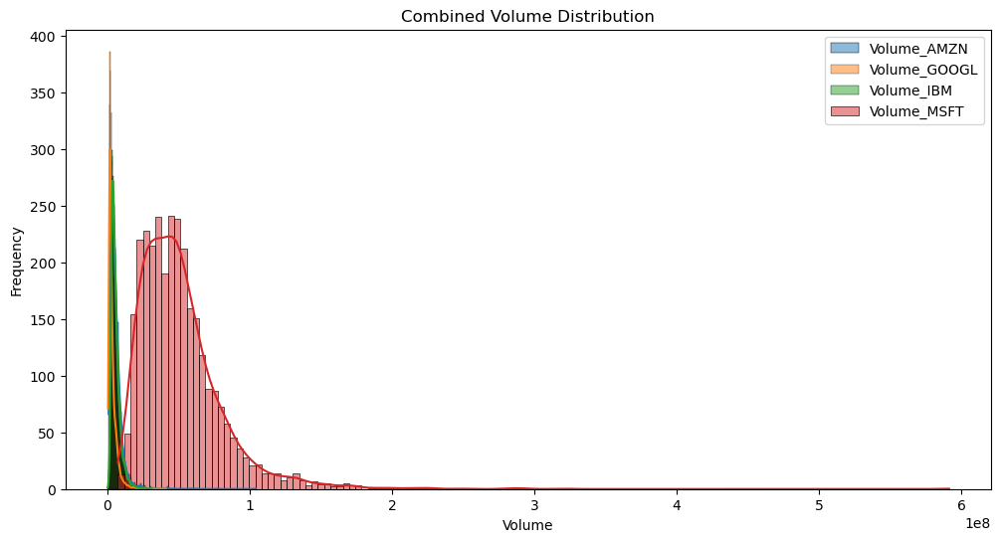

In [25]:
def plot_combined_volume_distributions(df):
    """
    Plots the frequency distribution of volume data for all companies in a single plot.
    
    """
    # Extract Volume Columns
    volume_cols = [col for col in df.columns if col.startswith('Volume_')]
    if not volume_cols:
        print("Error: No volume columns found in the DataFrame.")
        return

    # Create a Single Plot
    plt.figure(figsize=(12, 6))
    for volume_col in volume_cols:
        sns.histplot(df[volume_col], kde=True, label=volume_col) # Adding label for each company

    plt.title('Combined Volume Distribution')
    plt.xlabel('Volume')
    plt.ylabel('Frequency')
    plt.legend()  
    plt.show()

if df is not None:
  plot_combined_volume_distributions(df)
else:
  print("No data to plot. Please ensure data is loaded correctly.")


#### <font color = 'Brown'> 1.Right skewed distributions for all 4 stocks.

#### <font color = 'Brown'> 2.Especially, MSFT (red) shows a more noticeable skew compared to others, because its volume scale is much larger.

#### <font color = 'Red'> 1st plotting day wise trend

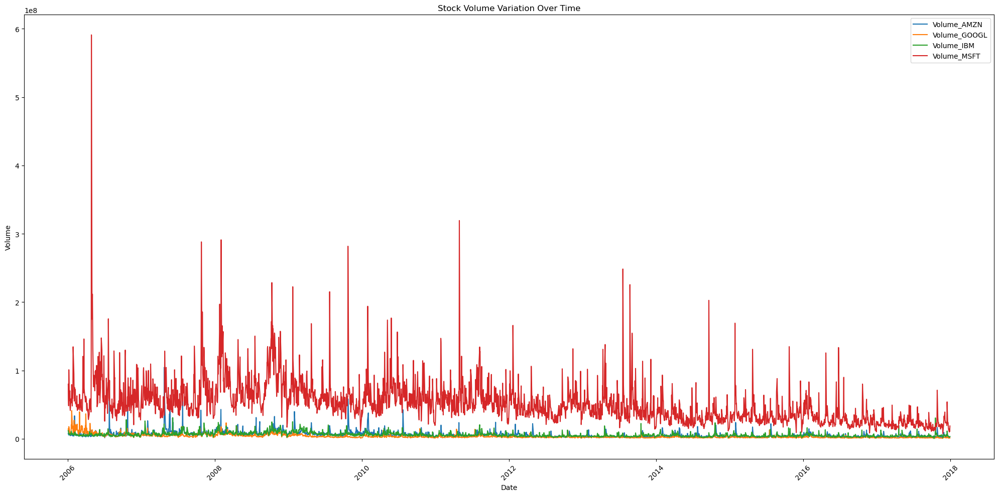

In [28]:
# Stock volume variation over time

def plot_volume_over_time(df):
    """
    Plots the stock volume variation over time for different companies in a single plot.

    Arguments:
        df (pandas.DataFrame): The DataFrame containing the stock data, with 'Date' and volume columns.
    """
    # Extract Volume Columns
    volume_cols = [col for col in df.columns if col.startswith('Volume_')]
    if not volume_cols:
        print("Error: No volume columns found in the DataFrame.")
        return

    # Showing all analysed stocks in a Single Plot
    plt.figure(figsize=(20, 10))
    for volume_col in volume_cols:
        plt.plot(df['Date'], df[volume_col], label=volume_col)  # Plotting each company's volume over time

    # Customizing the Plot
    plt.title('Stock Volume Variation Over Time')
    plt.xlabel('Date')
    plt.ylabel('Volume')
    plt.legend()  
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

if df is not None:
    plot_volume_over_time(df)
else:
    print("No data to plot. Please ensure data is loaded correctly.")


#### <font color = 'Red'> Now plotting: Weekly trend, Monthly trend and Quaterly trend

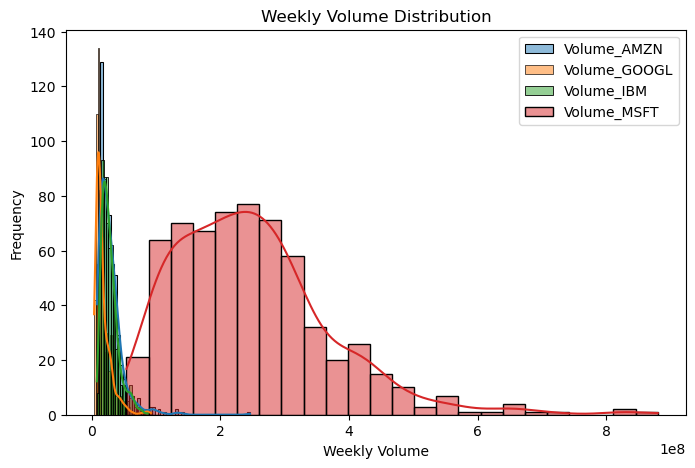

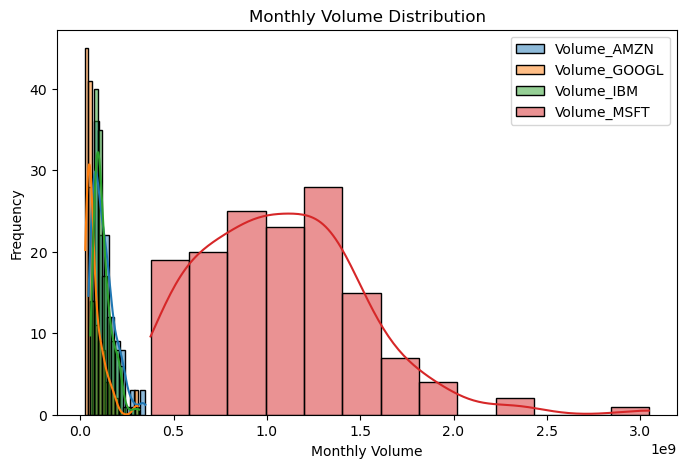

In [30]:
def plot_volume_distribution(df):
    """
    Plots the weekly or monthly, or quarterly distribution of stock volume for different companies.
    
    """
    # 1. Extract Volume Columns
    volume_cols = [col for col in df.columns if col.startswith('Volume_')]
    if not volume_cols:
        print("Error: No volume columns found in the DataFrame.")
        return

    # Converting 'Date' to datetime and then setting it as index
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.set_index('Date')

    # Resample to Weekly Frequency
    weekly_df = df[volume_cols].resample('W').sum()

    # Resample to Monthly Frequency
    monthly_df = df[volume_cols].resample('M').sum()

    # Resample to Quaterly Frequency
    quaterly_df = df[volume_cols].resample('Q').sum()

    # Creating Weekly Plots
    plt.figure(figsize=(8, 5))
    for volume_col in volume_cols:
        sns.histplot(weekly_df[volume_col], kde=True, label=volume_col)

    # Customizing the Plot
    plt.title('Weekly Volume Distribution')
    plt.xlabel('Weekly Volume')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

    # Creating Monthly Plots
    plt.figure(figsize=(8, 5))
    for volume_col in volume_cols:
        sns.histplot(monthly_df[volume_col], kde=True, label=volume_col)

    # Customizing the Plot
    plt.title('Monthly Volume Distribution')
    plt.xlabel('Monthly Volume')
    plt.ylabel('Frequency')
    plt.legend()
    plt.show()

plot_volume_distribution(df)

#### <font color = 'Brown'> We see that:

- Variation in Google stocks is barely visible in weekly, monthly, or quarterly trends.
- There is a slight increase in variation in the Amazon and IBM stocks, as quarterly variation > monthly variation > weekly variation.
- Variation in Microsoft stock is visible in all three weekly, monthly, and quarterly trends.
- Microsoft stocks have a bit of variation in daily trend. At the same time, variation in other stocks is minimal.

#### **1.2.2** <font color =red> [3 marks] </font>
Analyse correlations between features.

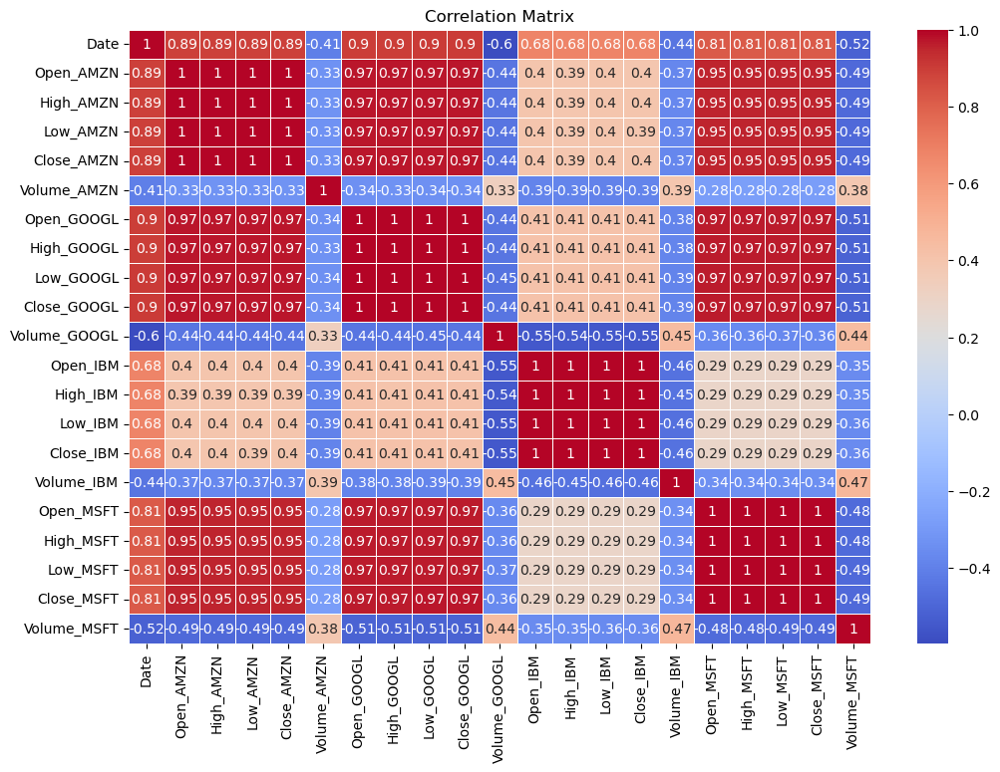

Correlations (Descending Order):
Correlation between Open_AMZN and High_AMZN: 1.00
Correlation between High_AMZN and Open_AMZN: 1.00
Correlation between Low_AMZN and Close_AMZN: 1.00
Correlation between Close_AMZN and Low_AMZN: 1.00
Correlation between High_AMZN and Close_AMZN: 1.00
Correlation between Close_AMZN and High_AMZN: 1.00
Correlation between Open_AMZN and Low_AMZN: 1.00
Correlation between Low_AMZN and Open_AMZN: 1.00
Correlation between Low_GOOGL and Close_GOOGL: 1.00
Correlation between Close_GOOGL and Low_GOOGL: 1.00
Correlation between Open_GOOGL and High_GOOGL: 1.00
Correlation between High_GOOGL and Open_GOOGL: 1.00
Correlation between High_AMZN and Low_AMZN: 1.00
Correlation between Low_AMZN and High_AMZN: 1.00
Correlation between High_GOOGL and Close_GOOGL: 1.00
Correlation between Close_GOOGL and High_GOOGL: 1.00
Correlation between Open_GOOGL and Low_GOOGL: 1.00
Correlation between Low_GOOGL and Open_GOOGL: 1.00
Correlation between Open_AMZN and Close_AMZN: 1.00
Co

In [33]:
# Analyse correlations

def analyze_correlations(df):
    """
    Analyzes and visualizes the correlations between features in the DataFrame.
    
    """
    # Correlation Matrix
    corr_matrix = df.corr()

    # Visualizing the Correlation Matrix
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title('Correlation Matrix')
    plt.show()

    # Store and sort correlations ( we would also see the correlations in descending order)
    correlation_list = []
    for col in corr_matrix.columns:
        for index in corr_matrix.index:
            if index != col:
                correlation_list.append({
                    'feature1': col,
                    'feature2': index,
                    'correlation': corr_matrix.loc[index, col]
                })

    # Sorting the list in descending order of absolute correlation
    correlation_list = sorted(correlation_list, key=lambda x: abs(x['correlation']), reverse=True)

    # Printing the sorted correlations
    print("Correlations (Descending Order):")
    for item in correlation_list:
        print(f"Correlation between {item['feature1']} and {item['feature2']}: {item['correlation']:.2f}")


analyze_correlations(df)

#### <font color = 'Red'> Plotting the pairplot to visualize the correlation

<Figure size 1500x1500 with 0 Axes>

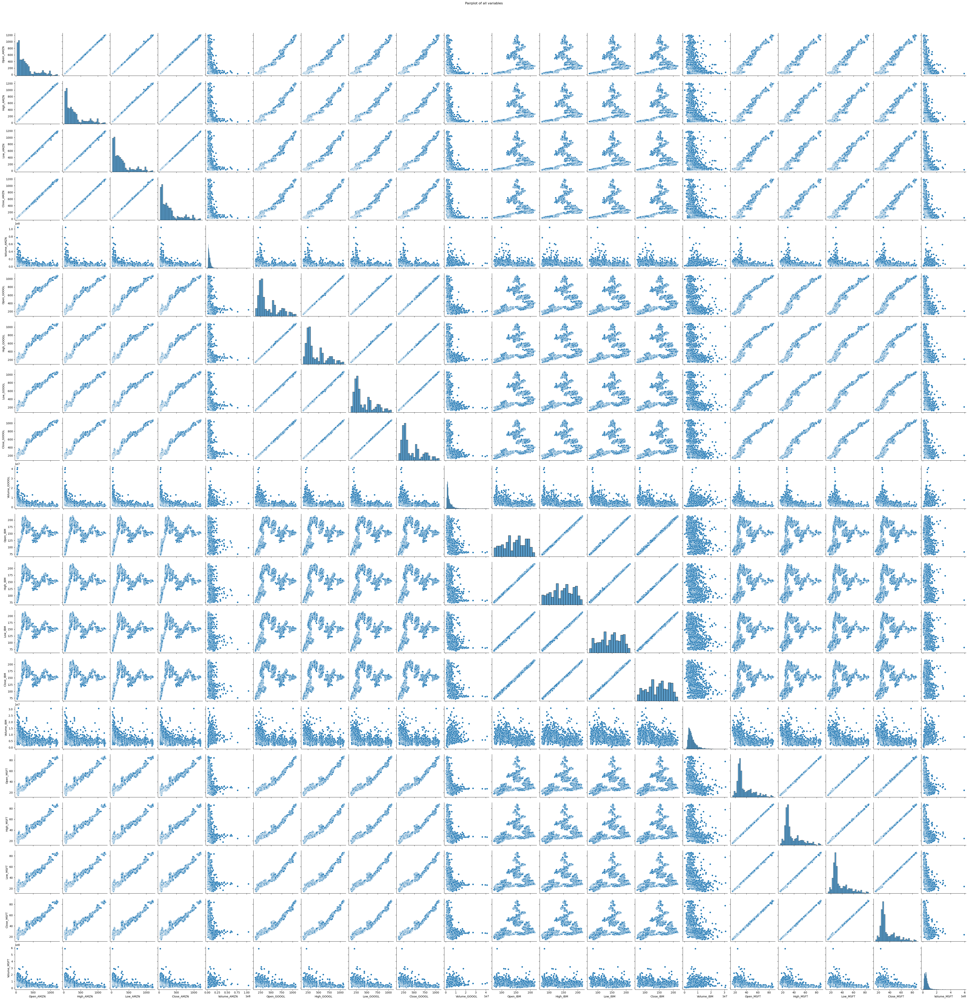

In [35]:
# Create the Pairplot
plt.figure(figsize=(15, 15))
sns.pairplot(df)

# Show the Plot
plt.suptitle("Pairplot of all variables", y=1.02)
plt.show()

#### <font color = 'Red'> Analyzing the correlation of "volumes" of companies with other features

Volume Correlations with Other Features:

Correlations for Volume_AMZN:
Date           -0.406418
Open_AMZN      -0.328318
High_AMZN      -0.326409
Low_AMZN       -0.330015
Close_AMZN     -0.328009
Open_GOOGL     -0.335282
High_GOOGL     -0.334037
Low_GOOGL      -0.337847
Close_GOOGL    -0.336239
Volume_GOOGL    0.327214
Open_IBM       -0.389324
High_IBM       -0.386539
Low_IBM        -0.392234
Close_IBM      -0.389026
Volume_IBM      0.390736
Open_MSFT      -0.279138
High_MSFT      -0.277289
Low_MSFT       -0.282671
Close_MSFT     -0.280460
Volume_MSFT     0.384698

Correlations for Volume_GOOGL:
Date          -0.596209
Open_AMZN     -0.440793
High_AMZN     -0.440776
Low_AMZN      -0.441497
Close_AMZN    -0.441292
Volume_AMZN    0.327214
Open_GOOGL    -0.443231
High_GOOGL    -0.440786
Low_GOOGL     -0.447852
Close_GOOGL   -0.444655
Open_IBM      -0.546490
High_IBM      -0.544280
Low_IBM       -0.549512
Close_IBM     -0.546949
Volume_IBM     0.445371
Open_MSFT     -0.363245
High_MSFT   

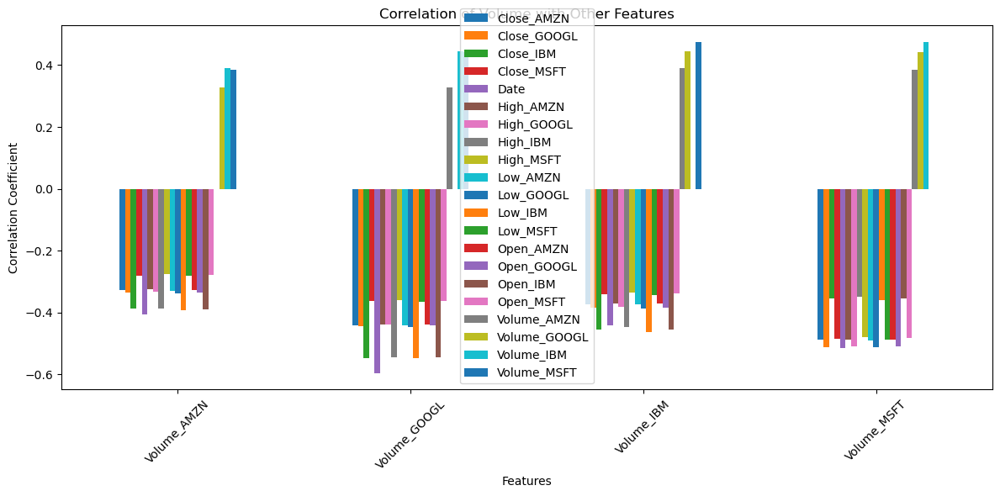

In [37]:
def analyze_volume_correlations(df):
    """
    Analyzes and visualizes the correlation of volume columns with other features.
    
    """
    # Extract Volume Columns
    volume_cols = [col for col in df.columns if col.startswith('Volume_')]
    if not volume_cols:
        print("Error: No volume columns found in the DataFrame.")
        return

    # Calculate Correlations
    volume_correlations = {}
    for volume_col in volume_cols:
        correlations = df.corr()[volume_col].drop(volume_col)  # Drop self-correlation
        volume_correlations[volume_col] = correlations

    # Print Correlations
    print("Volume Correlations with Other Features:")
    for volume_col, correlations in volume_correlations.items():
        print(f"\nCorrelations for {volume_col}:")
        print(correlations.to_string())  # Printing the correlations in a readable format

    # Visualize Correlations (using Bar Plot)
    plt.figure(figsize=(12, 6))

    # Creating a DataFrame for plotting
    plot_df = pd.DataFrame(volume_correlations).T  # Transposing for easier plotting
    plot_df.plot(kind='bar', ax=plt.gca()) # plot the dataframe on current ax
    plt.title("Correlation of Volume with Other Features")
    plt.ylabel("Correlation Coefficient")
    plt.xlabel("Features")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

if df is not None:
    analyze_volume_correlations(df)
else:
    print("No data to analyze. Please ensure data is loaded correctly.")

#### <font color = 'Brown'> Our Analysis says:
1. For all stocks (AMZN, GOOGL, IBM, MSFT), Volume is negatively correlated with Date. 
2. Volumes are negatively correlated with their own stock's Open, High, Low, Close prices , meaning As the stock prices increase, the trading volume tends to decrease slightly.
3. Strongly correlated pairs:
    
    a.Volume_IBM and Volume_MSFT have the highest positive correlation (+0.4748).
    
    b.Volume_GOOGL and Date have the highest negative correlation (-0.596).
    

### **1.3 Data Processing** <font color =red> [13 marks] </font>

Next, we need to process the data so that it is ready to be used in recurrent neural networks. You know RNNs are suitable to work with sequential data where patterns repeat at regular intervals.

For this, we need to execute the following steps:
1. Create windows from the master data frame and obtain windowed `X` and corresponding windowed `y` values
2. Perform train-test split on the windowed data
3. Scale the data sets in an appropriate manner

We will define functions for the above steps that finally return training and testing data sets that are ready to be used in recurrent neural networks.

**Hint:** If we use a window of size 3, in the first window, the rows `[0, 1, 2]` will be present and will be used to predict the value of `CloseAMZN` in row `3`. In the second window, rows `[1, 2, 3]` will be used to predict `CloseAMZN` in row `4`.

#### **1.3.1** <font color =red> [3 marks] </font>
Create a function that returns the windowed `X` and `y` data.

From the main DataFrame, this function will create windowed DataFrames, and store those as a list of DataFrames.

Controllable parameters will be window size, step size (window stride length) and target names as a list of the names of stocks whose closing values we wish to predict.

In [44]:
# Define a function that divides the data into windows and generates target variable values for each window

def window_size_generates_tgtvar(df, window_size, target_column, step_size=1):
    """
    Divides the data into overlapping windows and generates target variable values
    for use in a Recurrent Neural Network (RNN) model.
       
    """
    # Check for Target Column
    if target_column not in df.columns:
        print(f"Error: Target column '{target_column}' not found in DataFrame.")
        return None, None

    # Prepare Input Data (X)
    num_features = df.shape[1]
    X = []
    y = []
    for i in range(0, len(df) - window_size, step_size):
        window = df.iloc[i:i + window_size].values  # Get the window data
        X.append(window)
        # Get the target value, which is the value *after* the window.
        target_index = i + window_size
        if target_index < len(df):
            target_value = df.iloc[target_index][target_column]
            y.append(target_value)
        else:
            # If the target index is out of bounds (at the very end of the dataframe),
            # we don't have a corresponding target.  Skip this last window.
            X.pop() # remove the last added window
            break

    X = np.array(X)
    y = np.array(y)
    print(f"Prepared data with shape X: {X.shape}, y: {y.shape}")
    return X, y

#### **1.3.2** <font color =red> [3 marks] </font>
Create a function to scale the data.

Define a function that will scale the data.

For scaling, we have to look at the whole length of data to find max/min values or standard deviations and means. If we scale the whole data at once, this will lead to data leakage in the windows. This is not necessarily a problem if the model is trained on the complete data with cross-validation.

One way to scale when dealing with windowed data is to use the `partial_fit()` method.
```
scaler.partial_fit(window)
scaler.transform(window)
```
You may use any other suitable way to scale the data properly. Arrive at a reasonable way to scale your data.

In [47]:
# Define a function that scales the windowed data
# The function takes in the windowed data sets and returns the scaled windows

def scaling_windowed_data(X):
    """
    Scales the windowed data using StandardScaler and partial_fit().
    
    """
    num_samples, window_size, num_features = X.shape
    scaler = MinMaxScaler()

    # Reshape X to (num_samples * window_size, num_features) for scaling
    X_reshaped = X[:, :, 1:].reshape(-1, num_features -1) # Exclude 'Date' column (index 0)


    # Using partial_fit() to incrementally fit the scaler. This is crucial for large datasets
    # where fitting the scaler on the entire dataset at once might be memory-intensive. Also, future data influences past data, causing data leakage and
    # This leads to overestimated model performance.
    scaler.partial_fit(X_reshaped)

    # Scale the data
    X_scaled_reshaped = scaler.transform(X_reshaped)

    # Reshape the scaled data back to the original shape, including 'Date'
    X_scaled = X_scaled_reshaped.reshape(num_samples, window_size, num_features-1)

    X_scaled = np.concatenate([X[:, :, :1], X_scaled], axis=2)



    return X_scaled, scaler

Next, define the main function that will call the windowing and scaling helper functions.

The input parameters for this function are:
- The joined master data set
- The names of the stocks that we wish to predict the *Close* prices for
- The window size
- The window stride
- The train-test split ratio

The outputs from this function are the scaled dataframes:
- *X_train*
- *y_train*
- *X_test*
- *y_test*

#### **1.3.3** <font color =red> [3 marks] </font>
Define a function to create windows of `window_size` and split the windowed data in to training and validation sets.

The function can take arguments such as list of target names, window size, window stride and split ratio. Use the windowing function here to make windows in the data and then perform scaling and train-test split.

In [51]:
# Define a function to create input and output data points from the master DataFrame

def prepare_data_for_rnn(df, window_size, stocks_to_predict, window_stride, train_test_ratio):
    """
    Prepares data for RNN modeling by windowing, scaling, and splitting into train/test sets.
   
    """
    results = {}
    for stock in stocks_to_predict:
        target_column = stock  # Constructing the target column name

        # Creating a copy of the DataFrame to avoid modifying the original DataFrame
        df_copy = df.copy()

        df_copy['Date'] = pd.to_datetime(df_copy['Date'])
        df_copy = df_copy.set_index('Date')

        X, y = window_size_generates_tgtvar(df_copy, window_size, target_column, window_stride)  # Using the helper function
        if X is None or y is None:
            print(f"Skipping stock {stock} due to missing target column.")
            results[stock] = None # sets the results to None for this stock
            continue

        # Split data into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, shuffle=False, random_state = 0)

        # Scale the data
        X_train_scaled, scaler = scaling_windowed_data(X_train) # Using the helper function

        # Reshape X_test before scaling to match the scaler's expected input shape
        X_test_to_scale = X_test[:, :, 1:] # selecting all rows, all columns except the first (Date)
        num_samples_test, window_size_test, num_features_test = X_test_to_scale.shape # getting the new shapes
        X_test_reshaped = X_test_to_scale.reshape(-1, num_features_test)  # Reshaping to 2D for scaler.transform
        X_test_scaled_reshaped = scaler.transform(X_test_reshaped) # transform
        X_test_scaled = X_test_scaled_reshaped.reshape(num_samples_test, window_size_test, num_features_test) # Reshaping back to original shape for RNN
        X_test_scaled = np.concatenate([X_test[:, :, :1], X_test_scaled], axis=2)  # re-adding the 'Date' column


        # Plotting the target variable
        plot_target_var(df_copy, target_column, stock) 

        results[stock] = {
            'X_train': X_train_scaled,
            'y_train': y_train,
            'X_test': X_test_scaled,
            'y_test': y_test,
            'avg_sample_length': X.shape[0],


        }
    return results


We can now use these helper functions to create our training and testing data sets. But first we need to decide on a length of windows. As we are doing time series prediction, we want to pick a sequence that shows some repetition of patterns.

For selecting a good sequence length, some business understanding will help us. In financial scenarios, we can either work with business days, weeks (which comprise of 5 working days), months, or quarters (comprising of 13 business weeks). Try looking for some patterns for these periods.

#### **1.3.4** <font color =red> [2 marks] </font>
Identify an appropriate window size.

For this, you can use plots to see how target variable is varying with time. Try dividing it into parts by weeks/months/quarters.

In [55]:
# Checking for patterns in different sequence lengths

def plot_target_var(df, target_column, stock_name):
    """
    Plots the target variable (e.g., closing price) over time,
    divided into weeks, months, and quarters.
    
    """
    if target_column not in df.columns:
        print(f"Error: Target column '{target_column}' not found in DataFrame.")
        return

    # Creating a figure with three subplots
    fig, ax = plt.subplots(3, 1, figsize=(10, 10), sharex=True)
    fig.suptitle(f'Target Variable ({target_column})  Variation With Time for Window Size {window_size}', fontsize=16)

    # Weekly
    ax[0].plot(df.index, df[target_column], label='Daily')
    ax[0].set_title('Weekly Aggregation')
    ax[0].set_ylabel(target_column)
    weekly_data = df.resample('W')[target_column].mean()
    ax[0].plot(weekly_data.index, weekly_data.values, label='Weekly Mean', color='red')
    ax[0].legend()

    # Monthly
    ax[1].plot(df.index, df[target_column], label='Daily')
    ax[1].set_title('Monthly Aggregation')
    ax[1].set_ylabel(target_column)
    monthly_data = df.resample('M')[target_column].mean()
    ax[1].plot(monthly_data.index, monthly_data.values, label='Monthly Mean', color='green')
    ax[1].legend()

    # Quarterly
    ax[2].plot(df.index, df[target_column], label='Daily')
    ax[2].set_title('Quarterly Aggregation')
    ax[2].set_ylabel(target_column)
    quarterly_data = df.resample('Q')[target_column].mean()
    ax[2].plot(quarterly_data.index, quarterly_data.values, label='Quarterly Mean', color='purple')
    ax[2].legend()

    plt.xlabel('Date')
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) 
    plt.show()


Prepared data with shape X: (3015, 3, 20), y: (3015,)


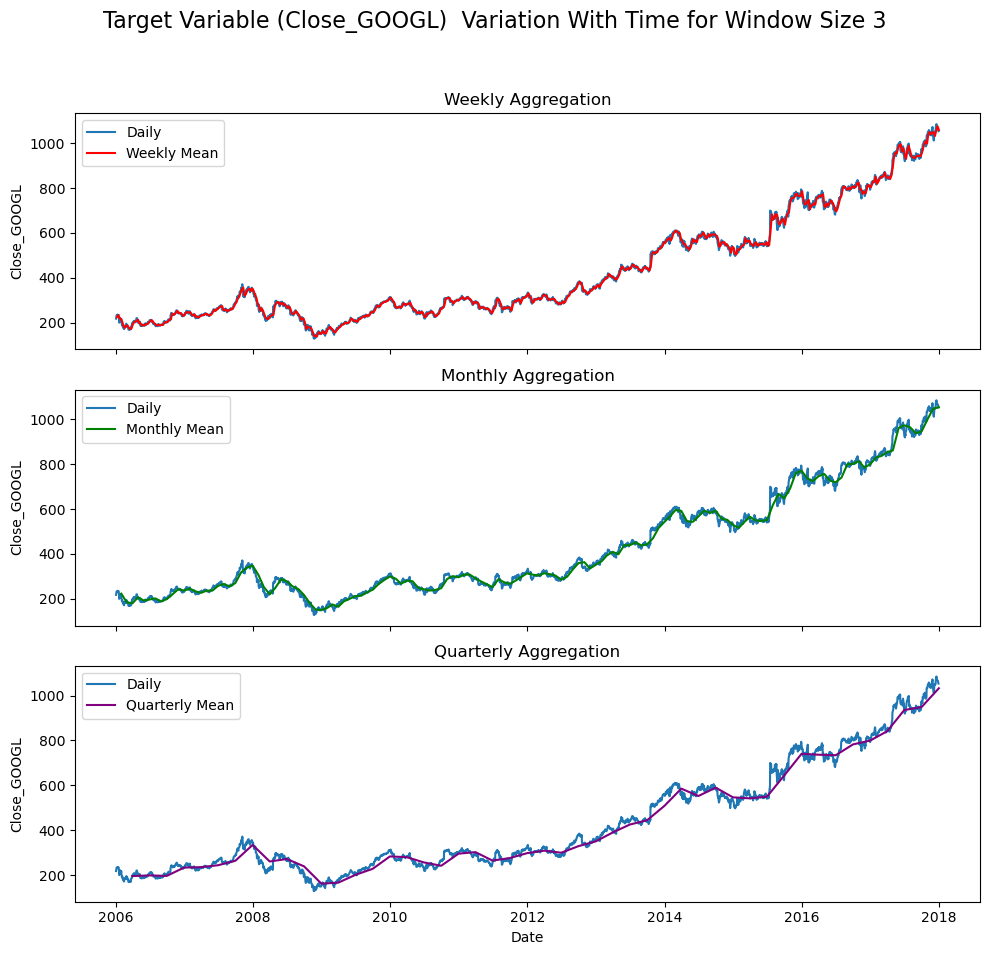

Prepared data with shape X: (3015, 3, 20), y: (3015,)


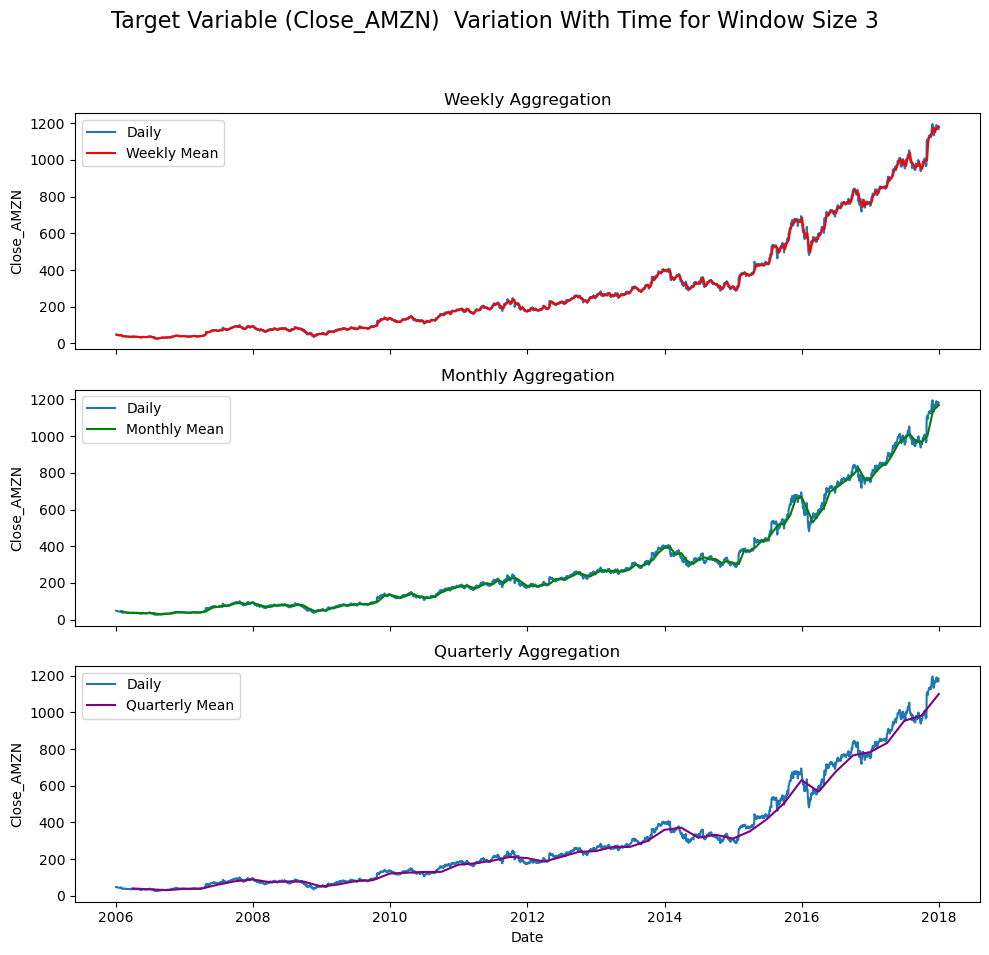

Prepared data with shape X: (3015, 3, 20), y: (3015,)


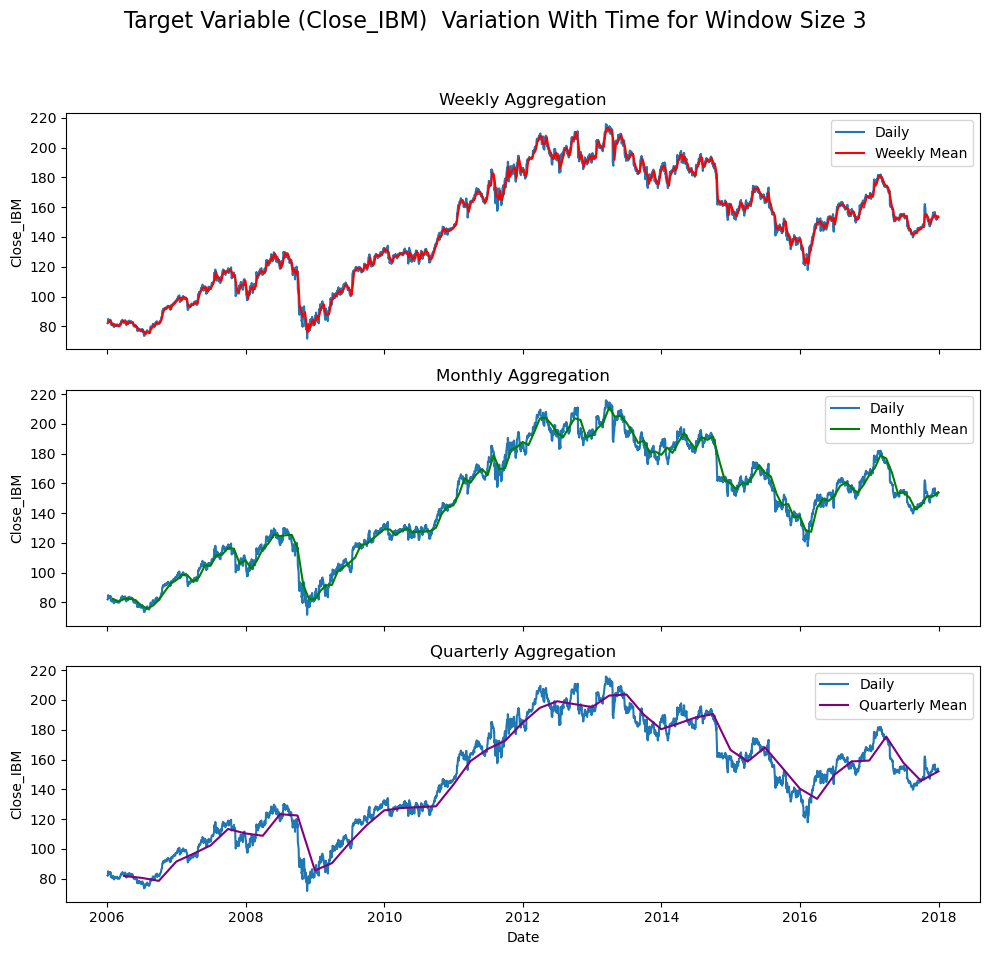

Prepared data with shape X: (3015, 3, 20), y: (3015,)


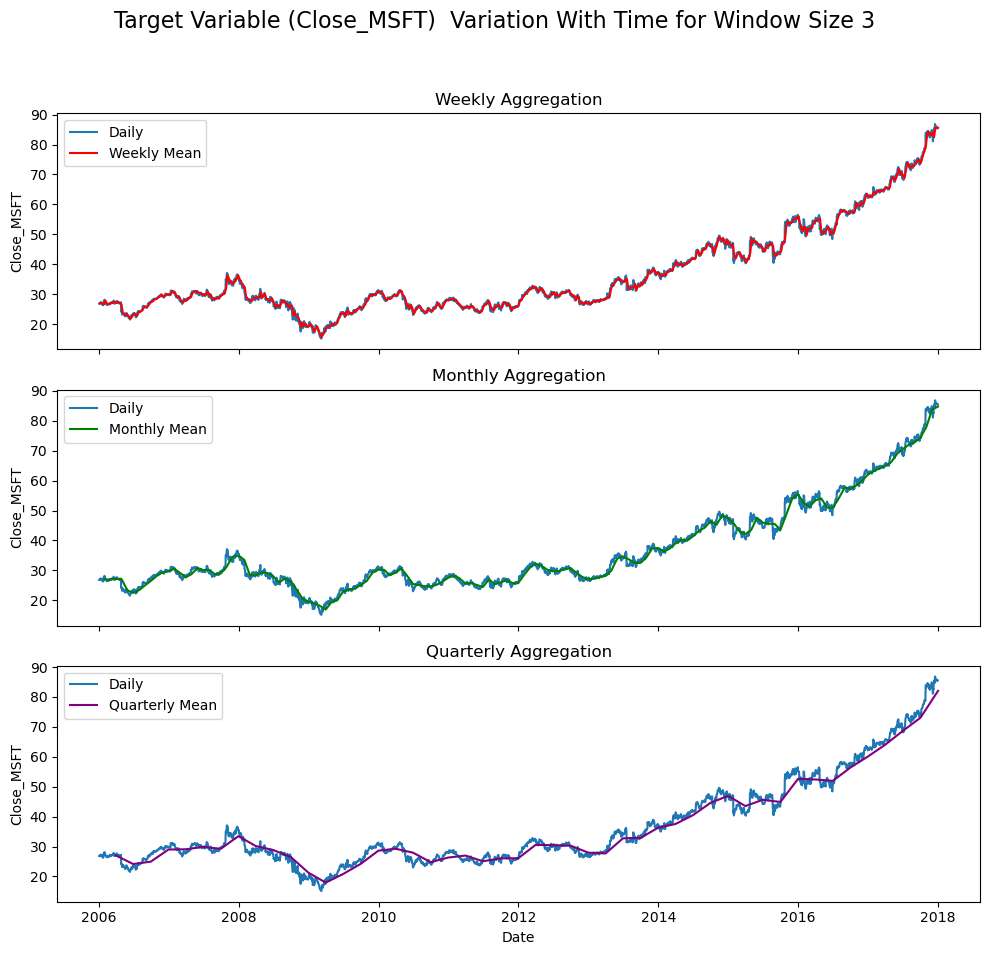

For Window size =  3

Data for stock: Close_GOOGL
X_train shape: (2412, 3, 20)
y_train shape: (2412,)
X_test shape: (603, 3, 20)
y_test shape: (603,)
avg_sample_length: 3015
For Window size =  3

Data for stock: Close_AMZN
X_train shape: (2412, 3, 20)
y_train shape: (2412,)
X_test shape: (603, 3, 20)
y_test shape: (603,)
avg_sample_length: 3015
For Window size =  3

Data for stock: Close_IBM
X_train shape: (2412, 3, 20)
y_train shape: (2412,)
X_test shape: (603, 3, 20)
y_test shape: (603,)
avg_sample_length: 3015
For Window size =  3

Data for stock: Close_MSFT
X_train shape: (2412, 3, 20)
y_train shape: (2412,)
X_test shape: (603, 3, 20)
y_test shape: (603,)
avg_sample_length: 3015
Prepared data with shape X: (3013, 5, 20), y: (3013,)


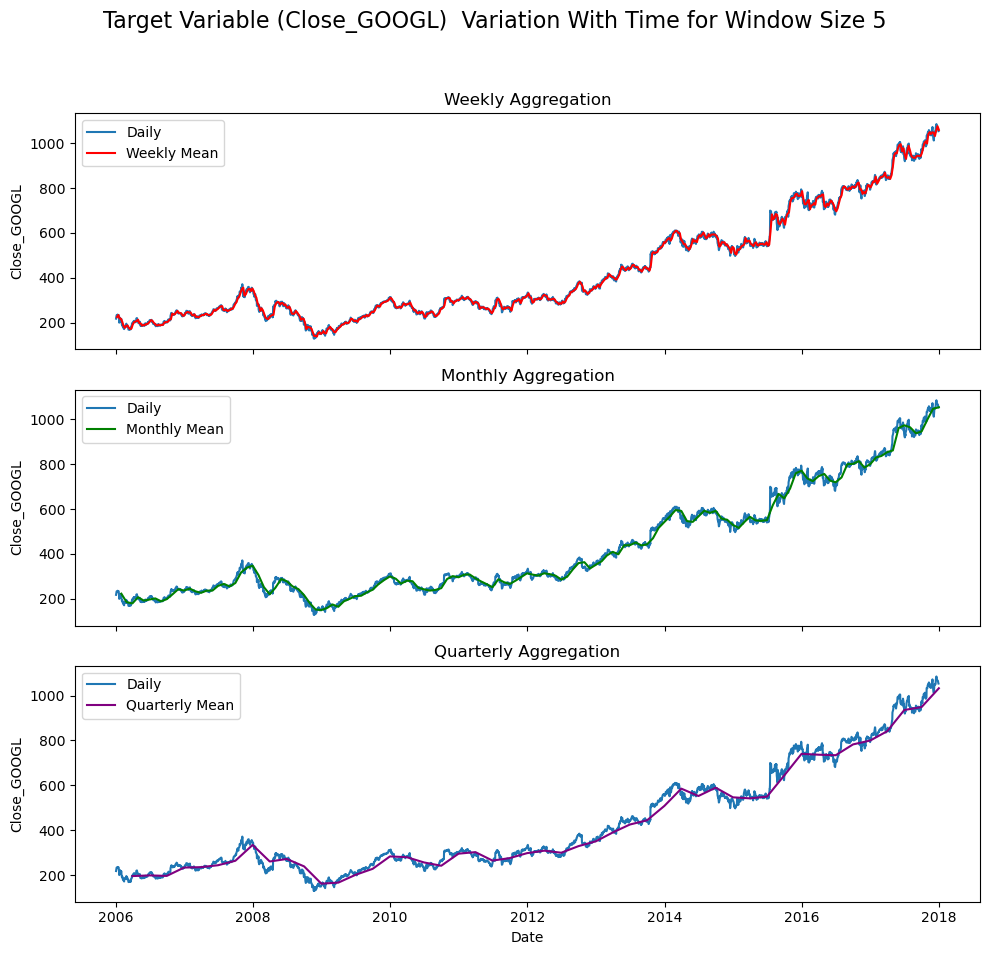

Prepared data with shape X: (3013, 5, 20), y: (3013,)


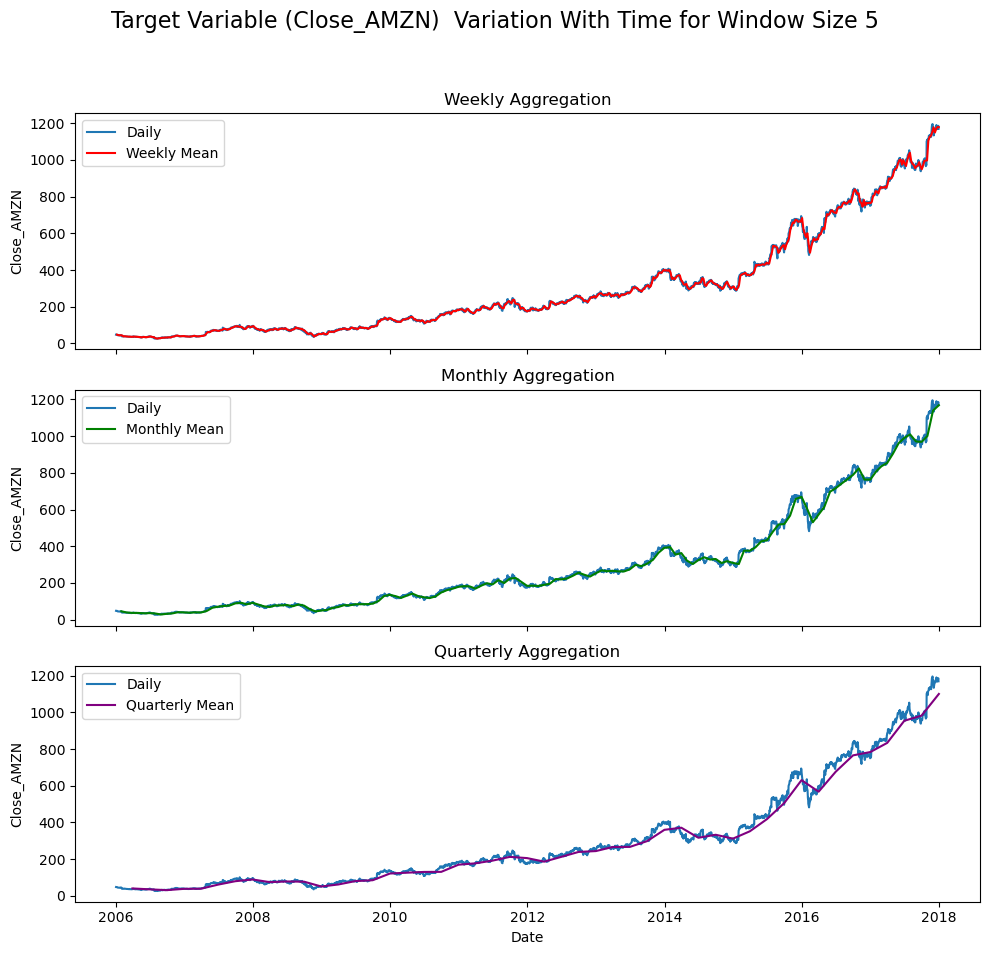

Prepared data with shape X: (3013, 5, 20), y: (3013,)


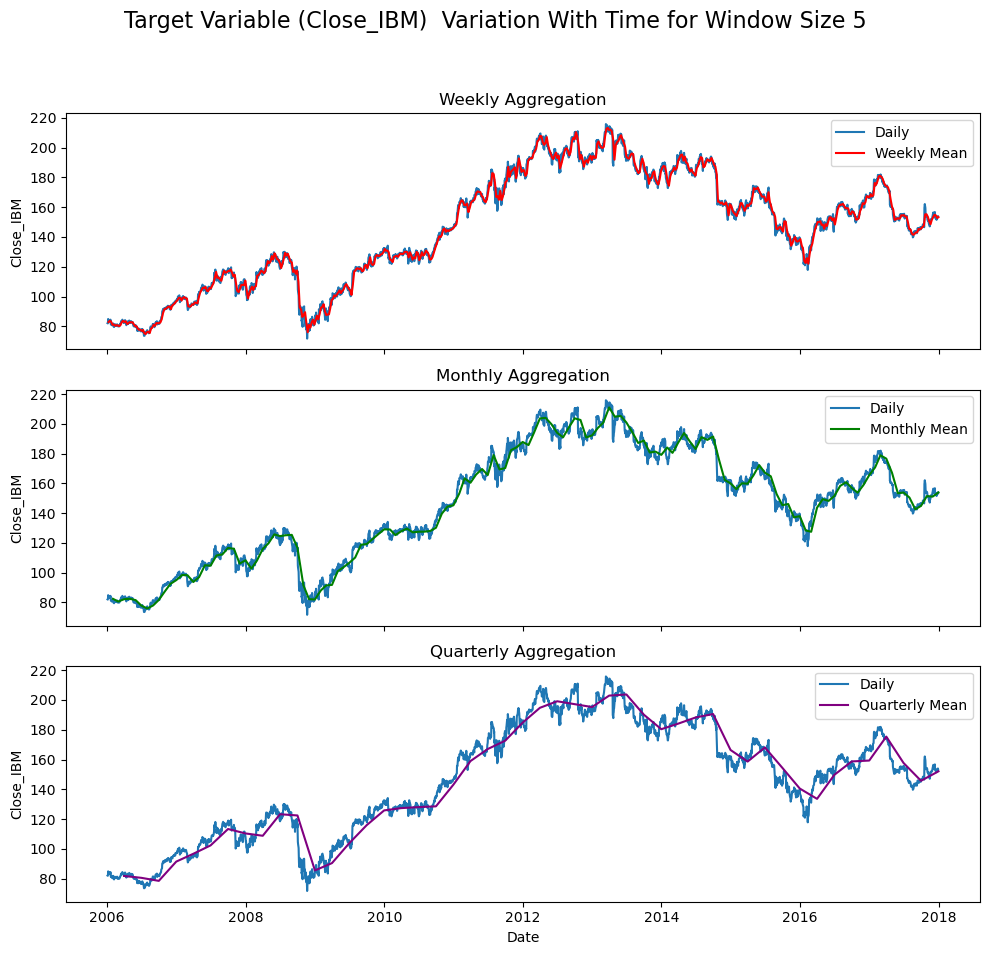

Prepared data with shape X: (3013, 5, 20), y: (3013,)


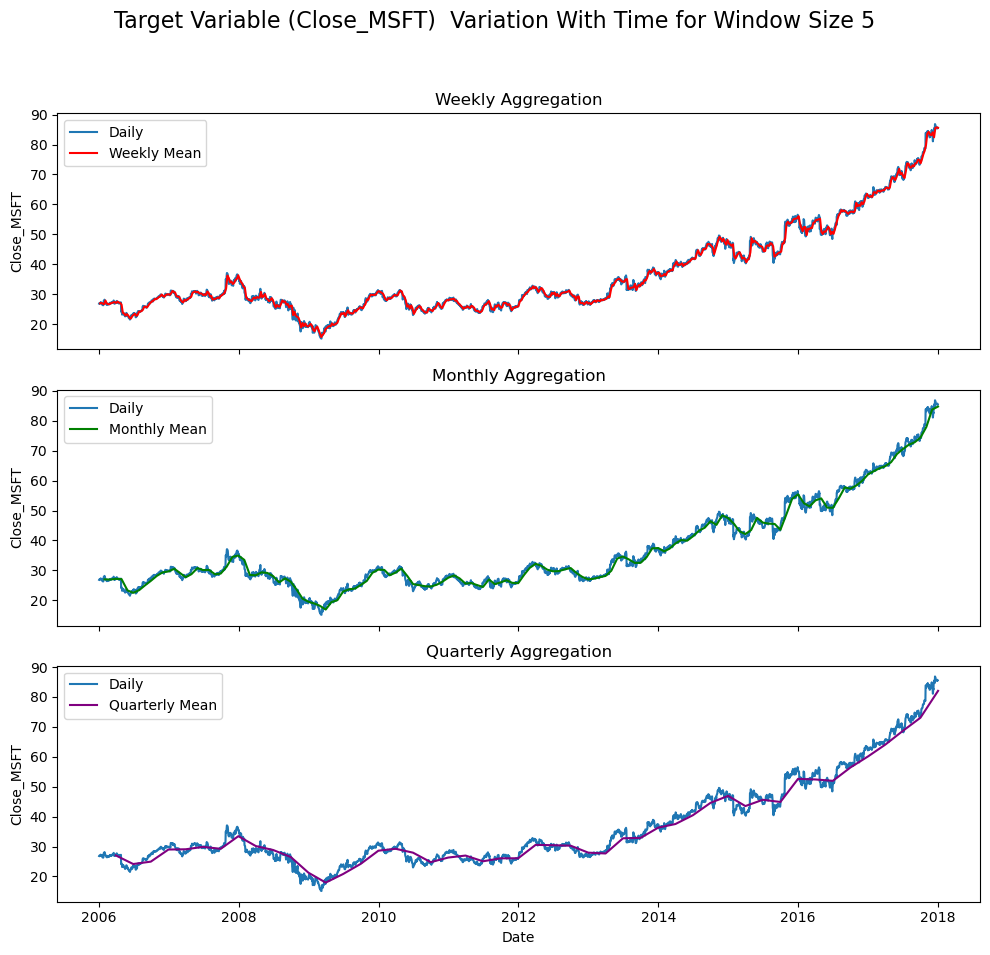

For Window size =  5

Data for stock: Close_GOOGL
X_train shape: (2410, 5, 20)
y_train shape: (2410,)
X_test shape: (603, 5, 20)
y_test shape: (603,)
avg_sample_length: 3013
For Window size =  5

Data for stock: Close_AMZN
X_train shape: (2410, 5, 20)
y_train shape: (2410,)
X_test shape: (603, 5, 20)
y_test shape: (603,)
avg_sample_length: 3013
For Window size =  5

Data for stock: Close_IBM
X_train shape: (2410, 5, 20)
y_train shape: (2410,)
X_test shape: (603, 5, 20)
y_test shape: (603,)
avg_sample_length: 3013
For Window size =  5

Data for stock: Close_MSFT
X_train shape: (2410, 5, 20)
y_train shape: (2410,)
X_test shape: (603, 5, 20)
y_test shape: (603,)
avg_sample_length: 3013
Prepared data with shape X: (3008, 10, 20), y: (3008,)


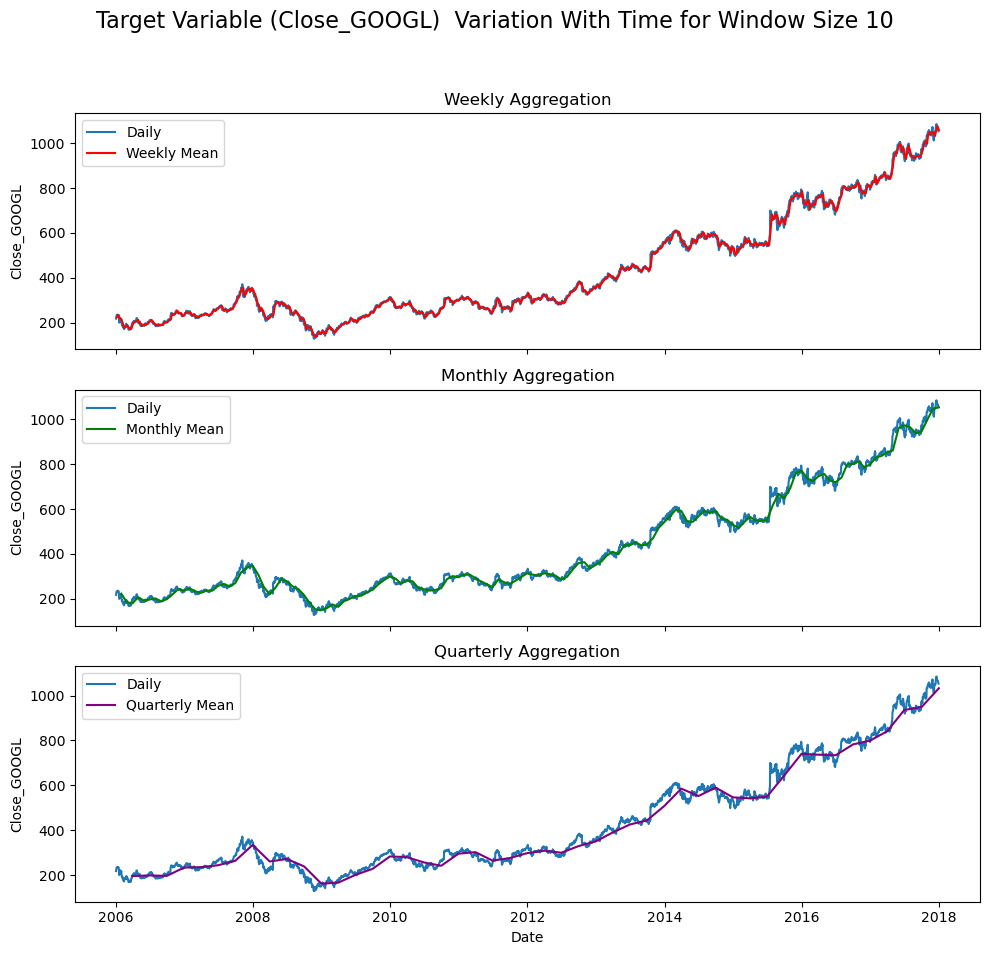

Prepared data with shape X: (3008, 10, 20), y: (3008,)


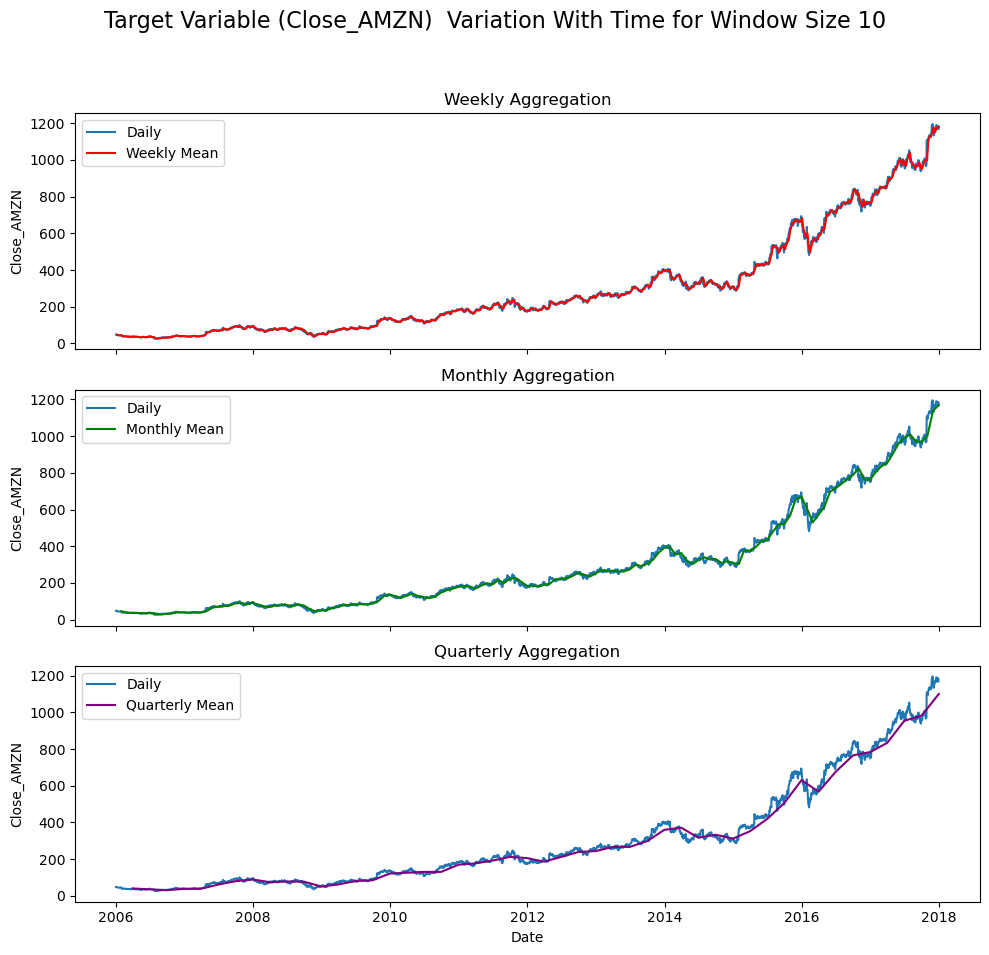

Prepared data with shape X: (3008, 10, 20), y: (3008,)


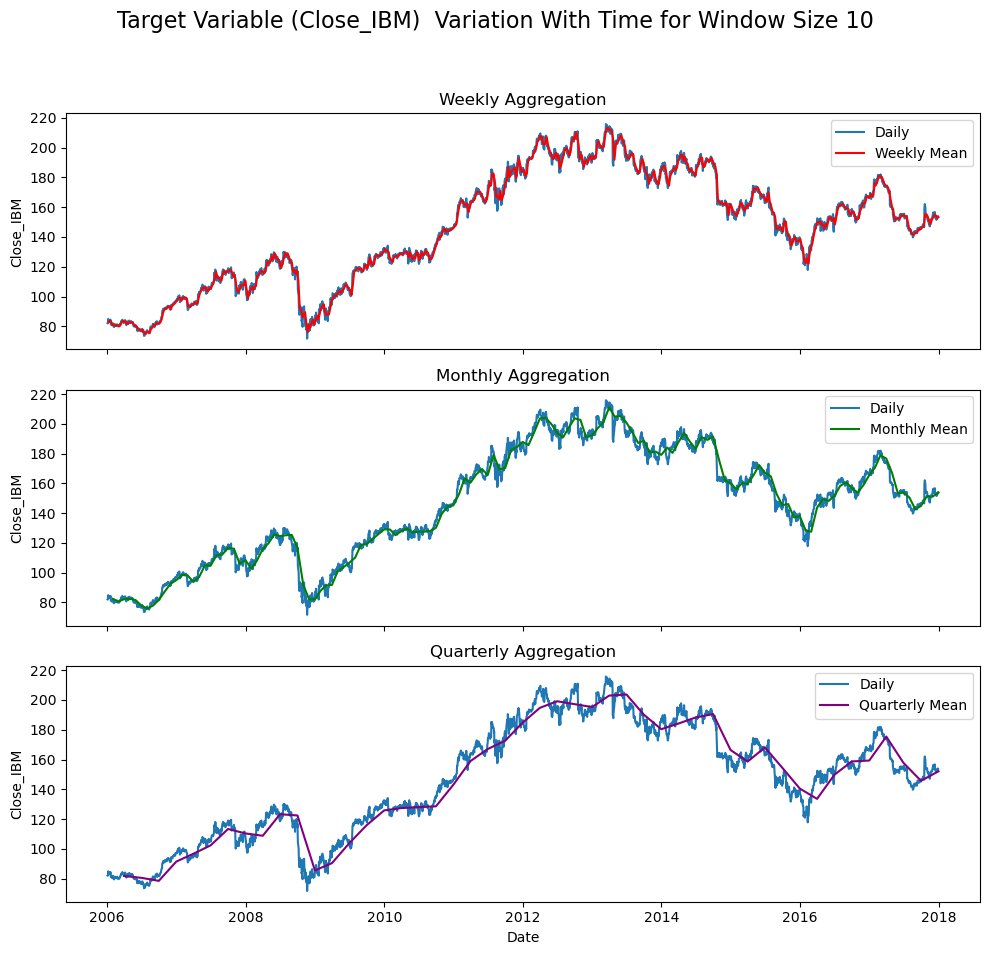

Prepared data with shape X: (3008, 10, 20), y: (3008,)


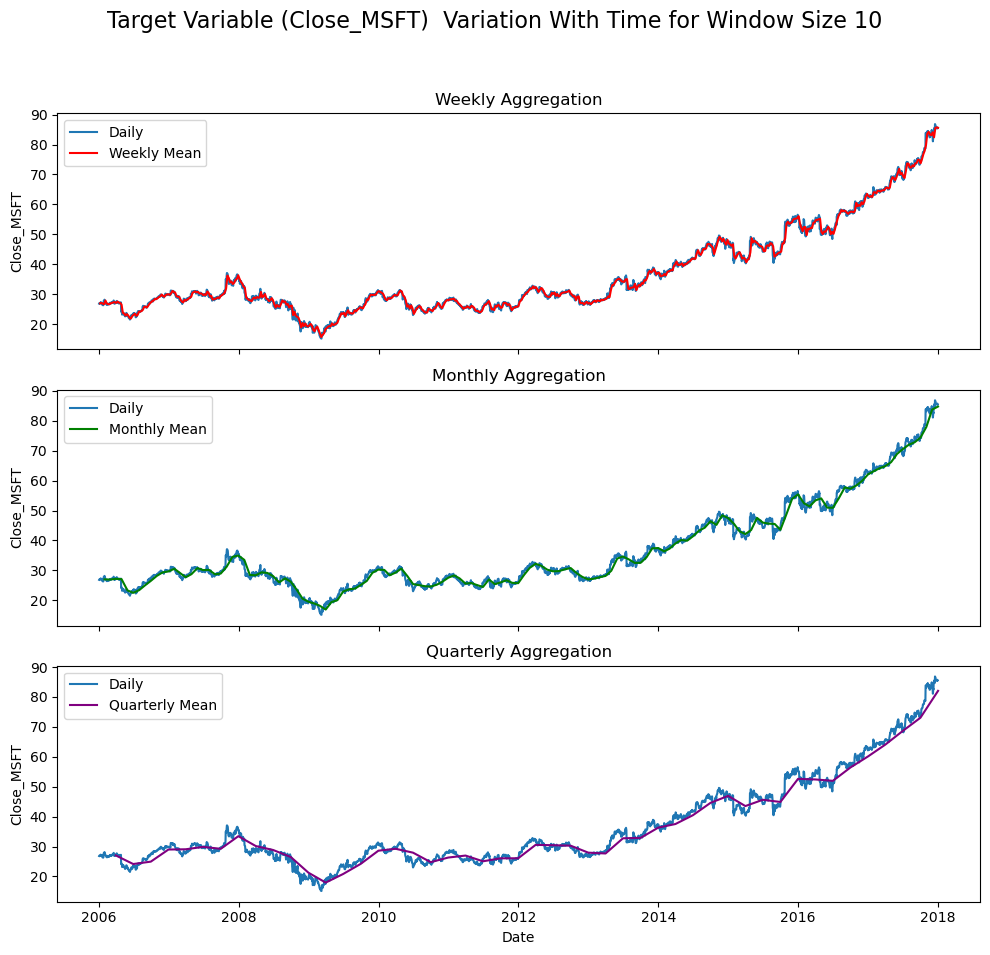

For Window size =  10

Data for stock: Close_GOOGL
X_train shape: (2406, 10, 20)
y_train shape: (2406,)
X_test shape: (602, 10, 20)
y_test shape: (602,)
avg_sample_length: 3008
For Window size =  10

Data for stock: Close_AMZN
X_train shape: (2406, 10, 20)
y_train shape: (2406,)
X_test shape: (602, 10, 20)
y_test shape: (602,)
avg_sample_length: 3008
For Window size =  10

Data for stock: Close_IBM
X_train shape: (2406, 10, 20)
y_train shape: (2406,)
X_test shape: (602, 10, 20)
y_test shape: (602,)
avg_sample_length: 3008
For Window size =  10

Data for stock: Close_MSFT
X_train shape: (2406, 10, 20)
y_train shape: (2406,)
X_test shape: (602, 10, 20)
y_test shape: (602,)
avg_sample_length: 3008
Prepared data with shape X: (3003, 15, 20), y: (3003,)


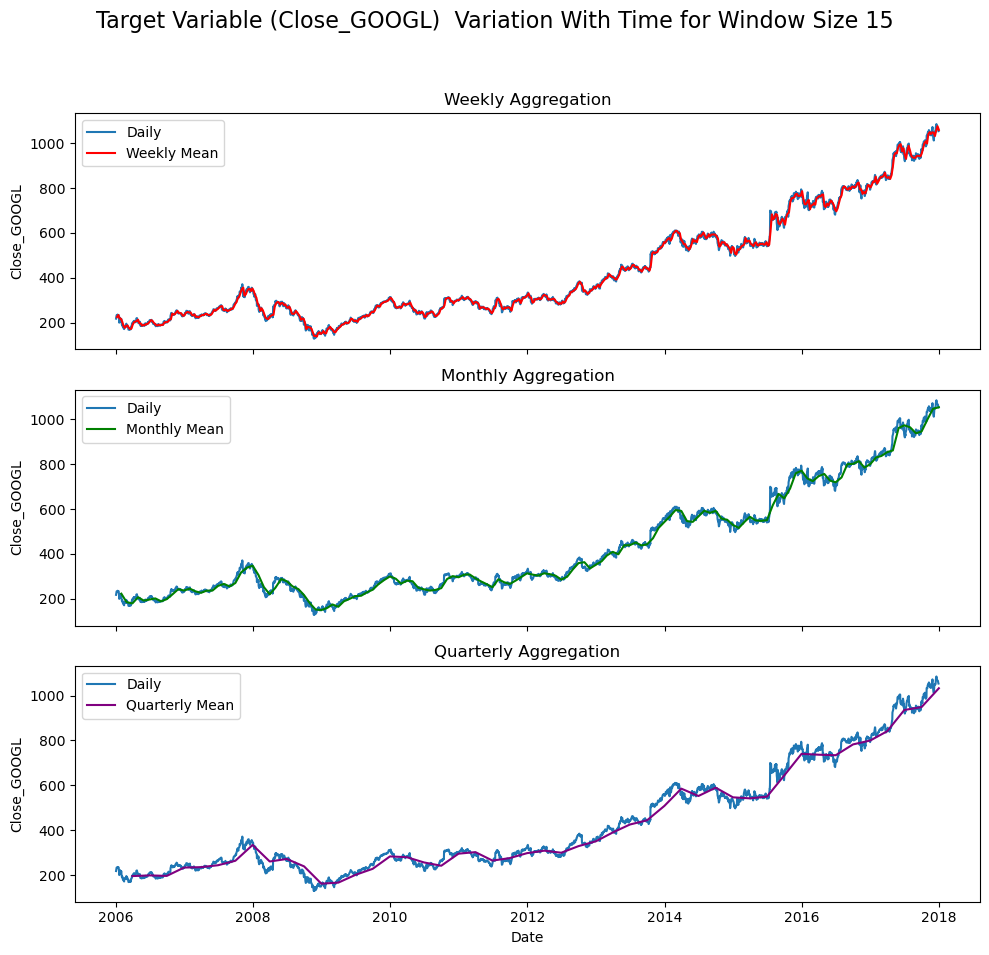

Prepared data with shape X: (3003, 15, 20), y: (3003,)


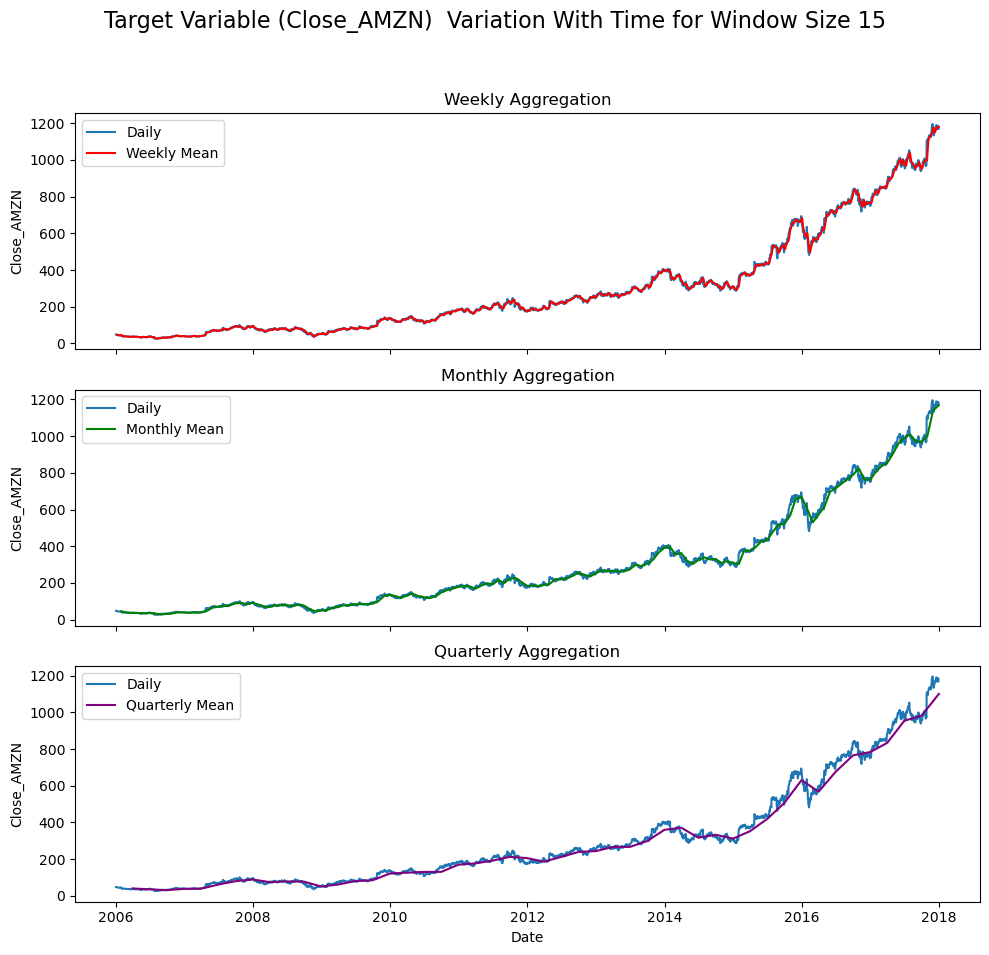

Prepared data with shape X: (3003, 15, 20), y: (3003,)


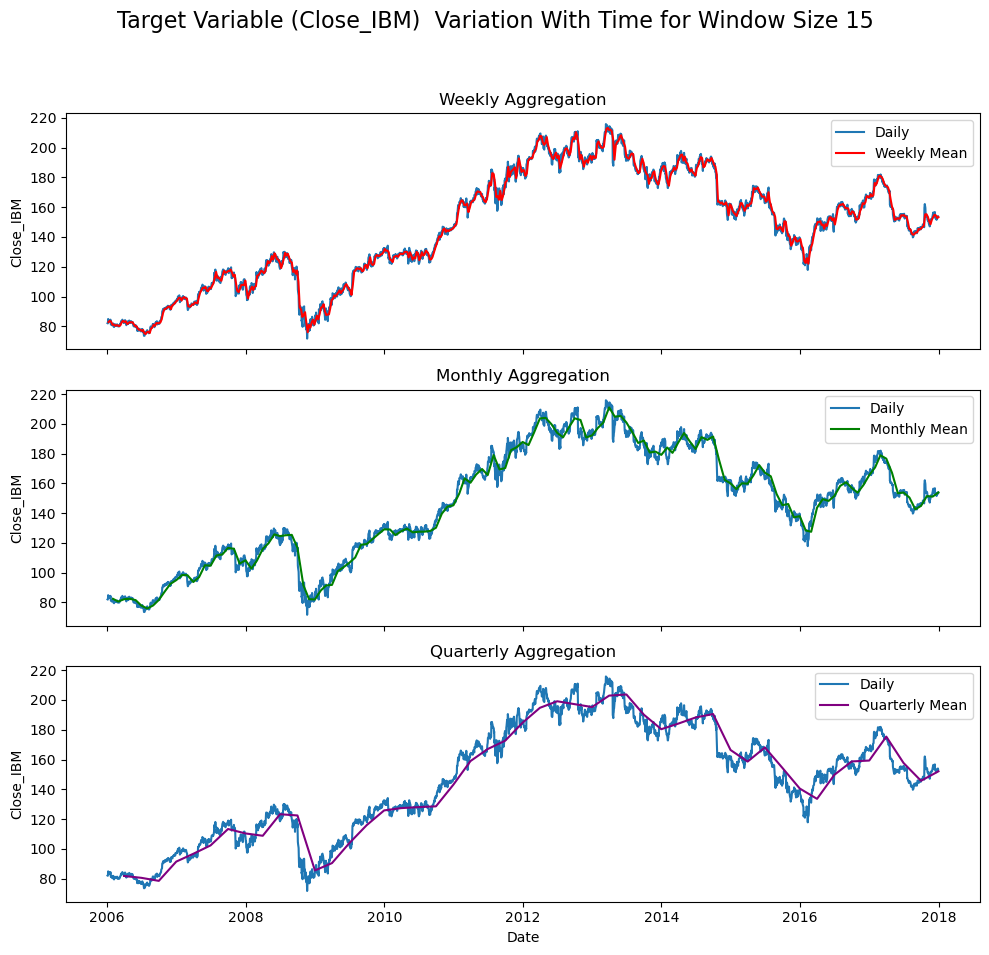

Prepared data with shape X: (3003, 15, 20), y: (3003,)


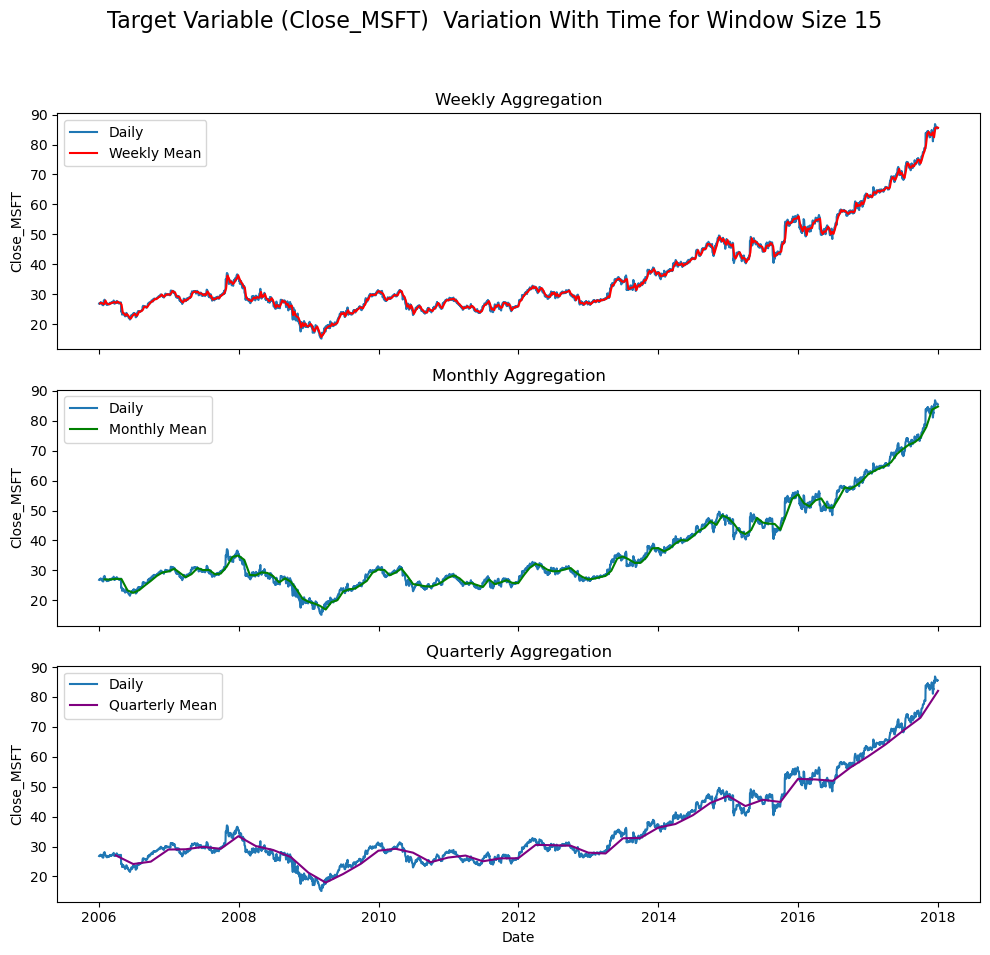

For Window size =  15

Data for stock: Close_GOOGL
X_train shape: (2402, 15, 20)
y_train shape: (2402,)
X_test shape: (601, 15, 20)
y_test shape: (601,)
avg_sample_length: 3003
For Window size =  15

Data for stock: Close_AMZN
X_train shape: (2402, 15, 20)
y_train shape: (2402,)
X_test shape: (601, 15, 20)
y_test shape: (601,)
avg_sample_length: 3003
For Window size =  15

Data for stock: Close_IBM
X_train shape: (2402, 15, 20)
y_train shape: (2402,)
X_test shape: (601, 15, 20)
y_test shape: (601,)
avg_sample_length: 3003
For Window size =  15

Data for stock: Close_MSFT
X_train shape: (2402, 15, 20)
y_train shape: (2402,)
X_test shape: (601, 15, 20)
y_test shape: (601,)
avg_sample_length: 3003
Prepared data with shape X: (2998, 20, 20), y: (2998,)


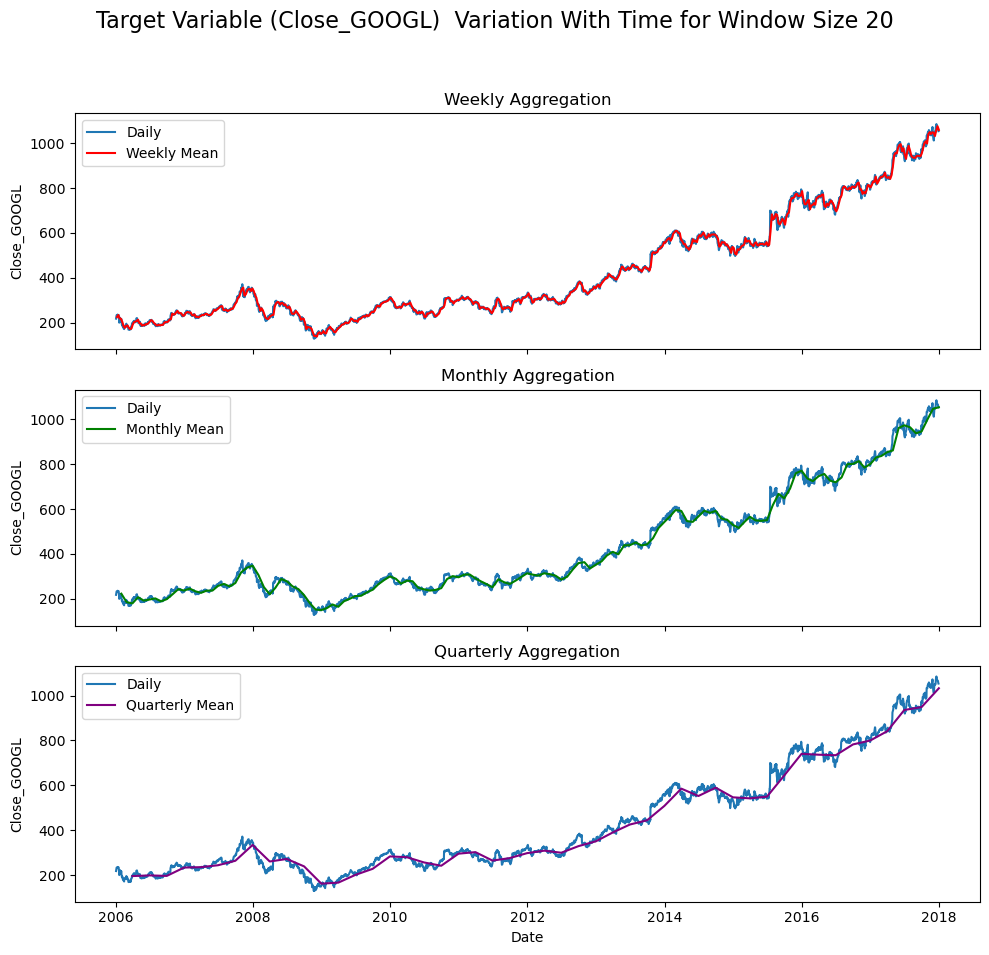

Prepared data with shape X: (2998, 20, 20), y: (2998,)


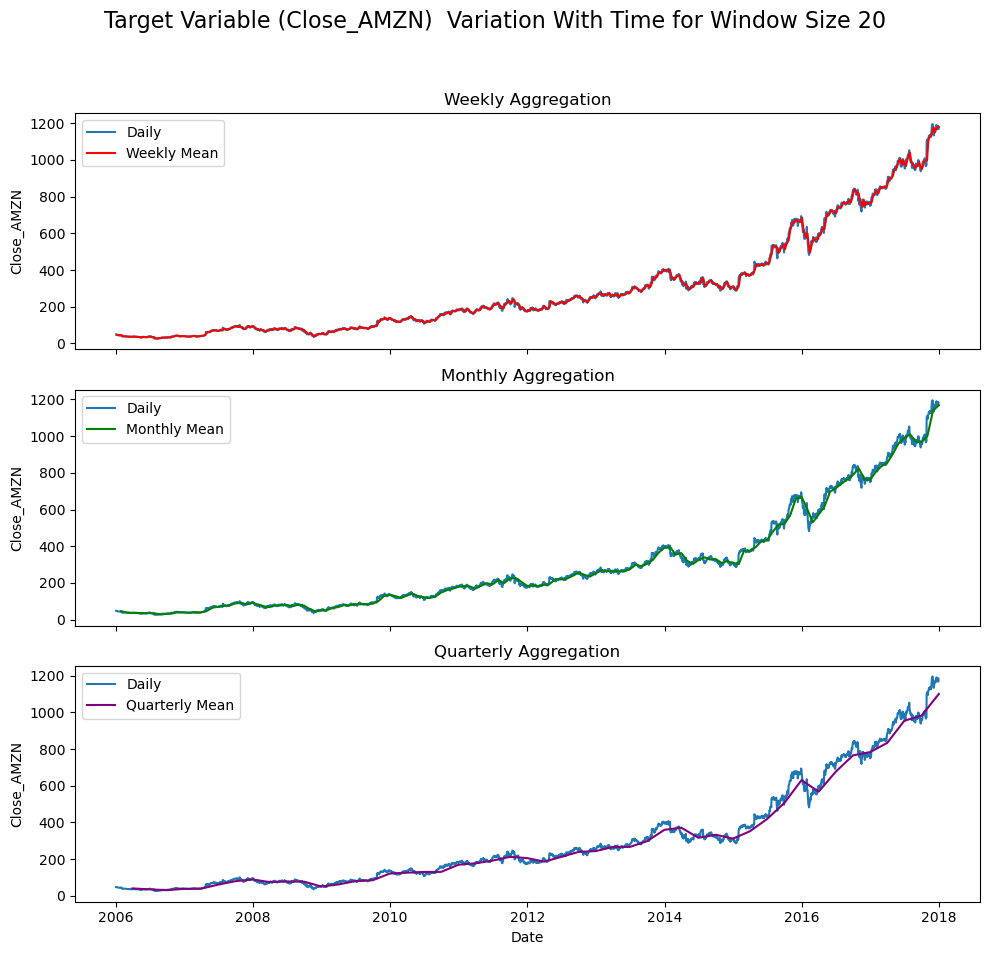

Prepared data with shape X: (2998, 20, 20), y: (2998,)


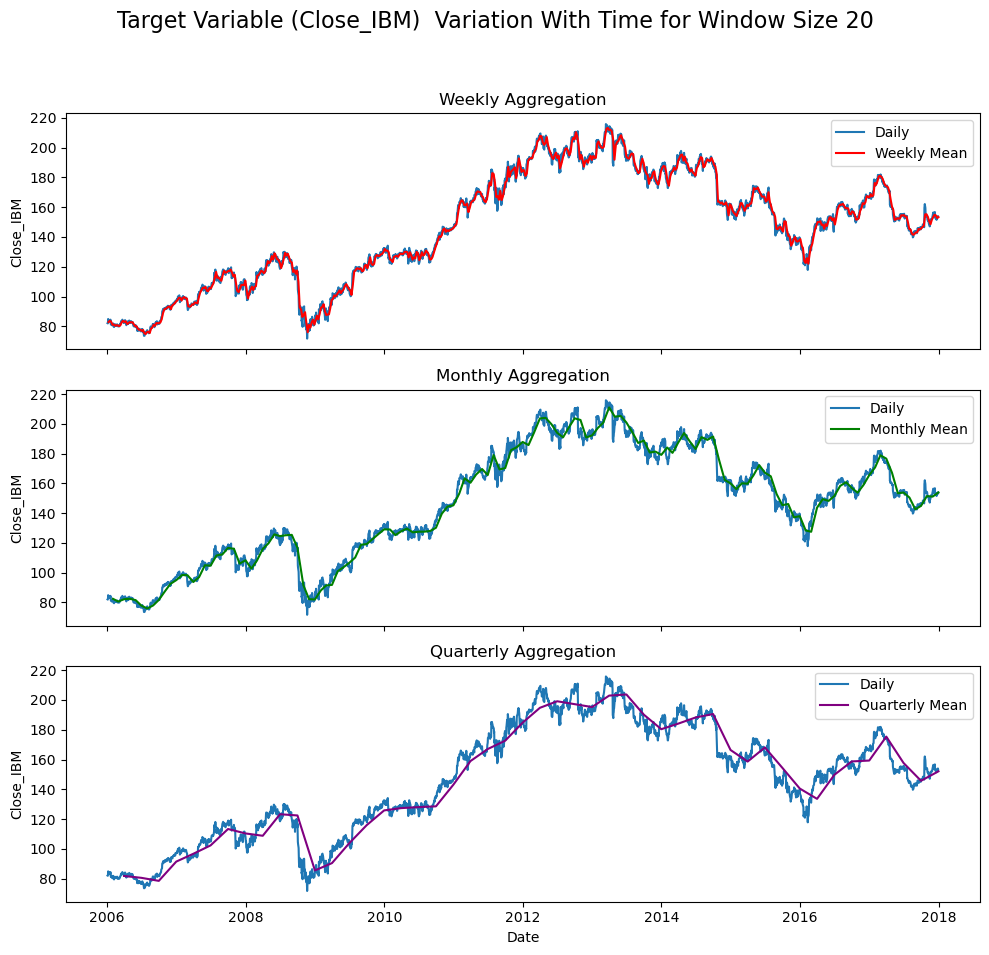

Prepared data with shape X: (2998, 20, 20), y: (2998,)


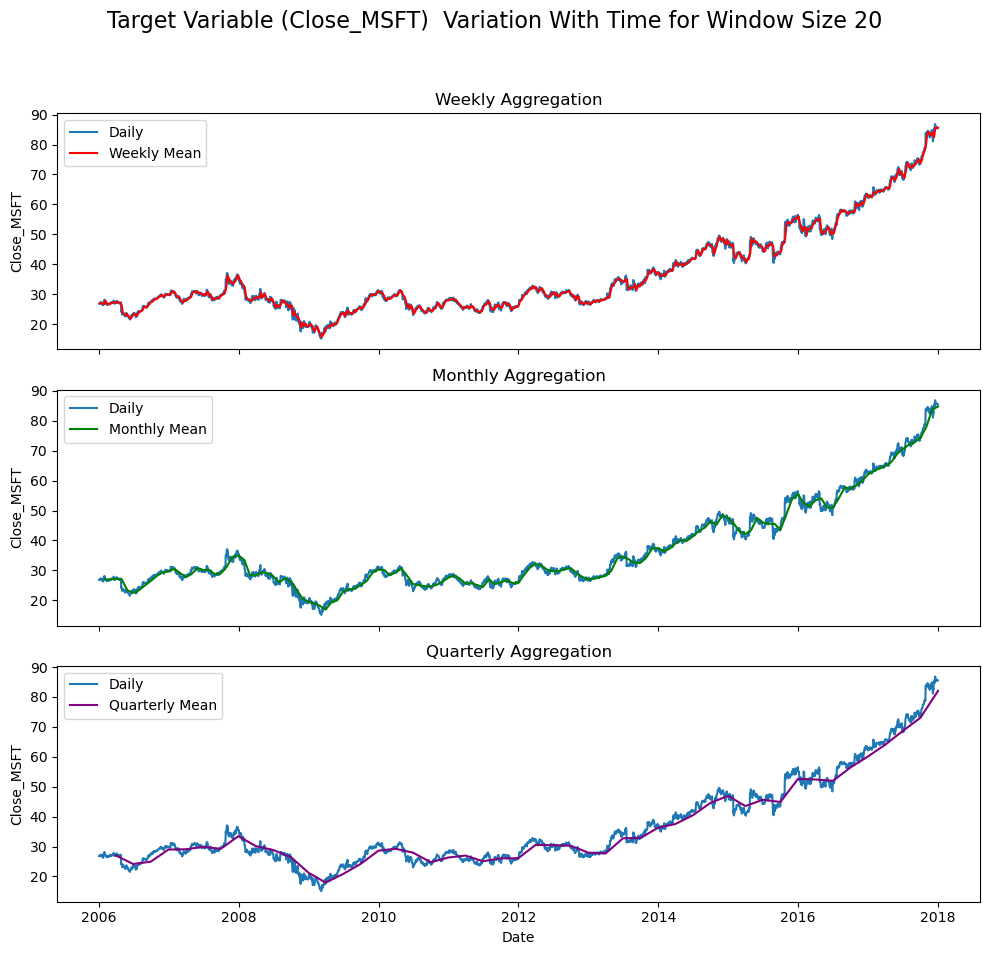

For Window size =  20

Data for stock: Close_GOOGL
X_train shape: (2398, 20, 20)
y_train shape: (2398,)
X_test shape: (600, 20, 20)
y_test shape: (600,)
avg_sample_length: 2998
For Window size =  20

Data for stock: Close_AMZN
X_train shape: (2398, 20, 20)
y_train shape: (2398,)
X_test shape: (600, 20, 20)
y_test shape: (600,)
avg_sample_length: 2998
For Window size =  20

Data for stock: Close_IBM
X_train shape: (2398, 20, 20)
y_train shape: (2398,)
X_test shape: (600, 20, 20)
y_test shape: (600,)
avg_sample_length: 2998
For Window size =  20

Data for stock: Close_MSFT
X_train shape: (2398, 20, 20)
y_train shape: (2398,)
X_test shape: (600, 20, 20)
y_test shape: (600,)
avg_sample_length: 2998
Prepared data with shape X: (2993, 25, 20), y: (2993,)


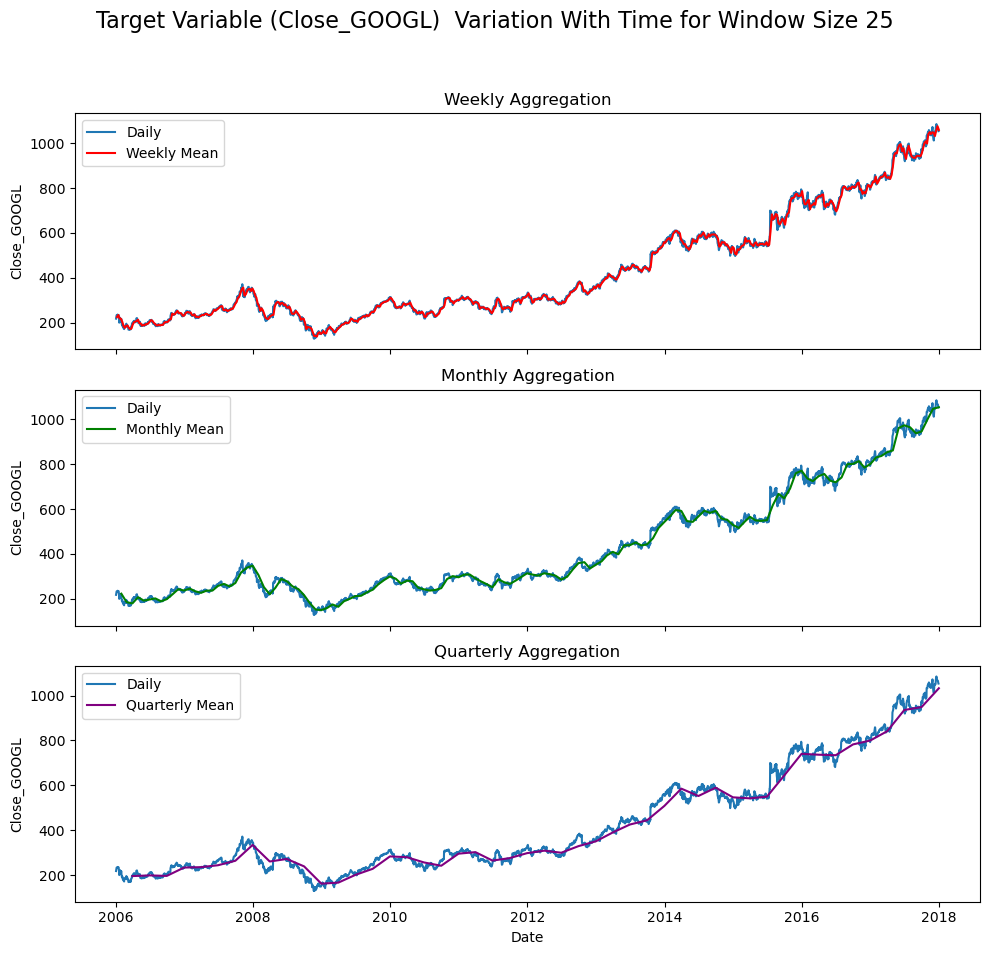

Prepared data with shape X: (2993, 25, 20), y: (2993,)


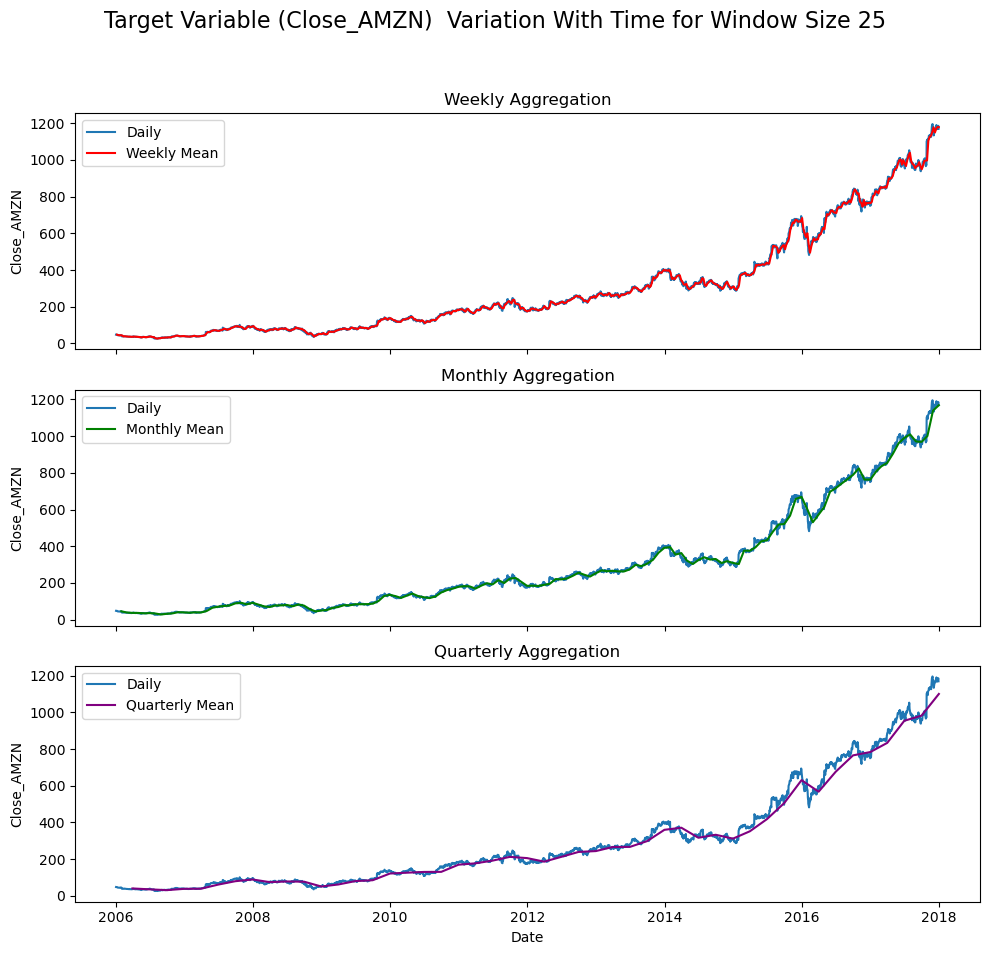

Prepared data with shape X: (2993, 25, 20), y: (2993,)


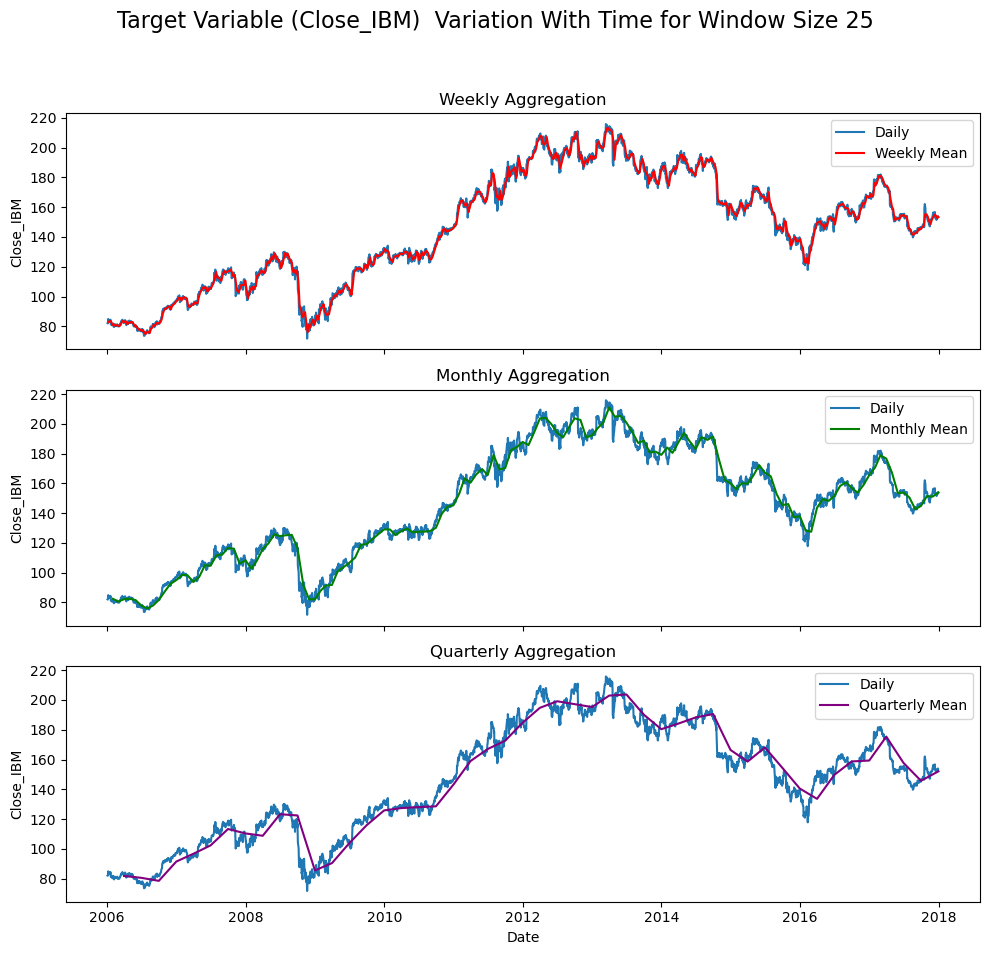

Prepared data with shape X: (2993, 25, 20), y: (2993,)


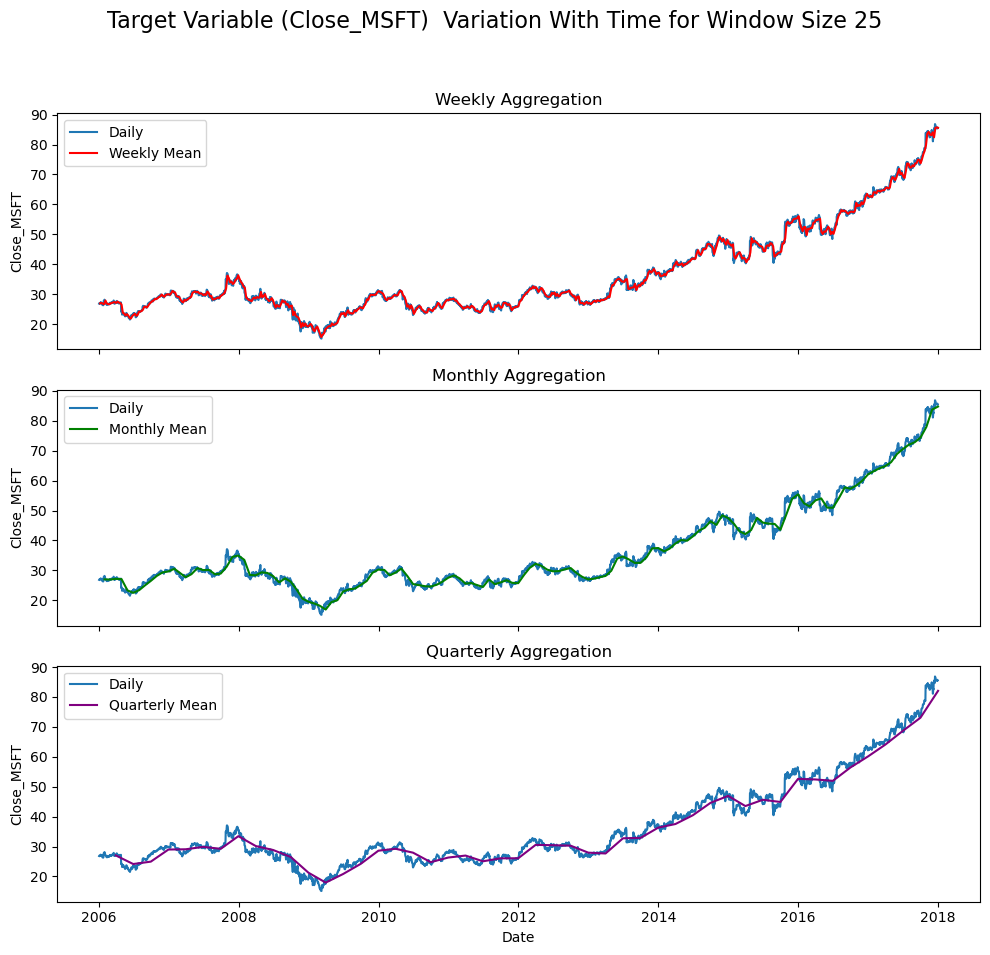

For Window size =  25

Data for stock: Close_GOOGL
X_train shape: (2394, 25, 20)
y_train shape: (2394,)
X_test shape: (599, 25, 20)
y_test shape: (599,)
avg_sample_length: 2993
For Window size =  25

Data for stock: Close_AMZN
X_train shape: (2394, 25, 20)
y_train shape: (2394,)
X_test shape: (599, 25, 20)
y_test shape: (599,)
avg_sample_length: 2993
For Window size =  25

Data for stock: Close_IBM
X_train shape: (2394, 25, 20)
y_train shape: (2394,)
X_test shape: (599, 25, 20)
y_test shape: (599,)
avg_sample_length: 2993
For Window size =  25

Data for stock: Close_MSFT
X_train shape: (2394, 25, 20)
y_train shape: (2394,)
X_test shape: (599, 25, 20)
y_test shape: (599,)
avg_sample_length: 2993
Prepared data with shape X: (2988, 30, 20), y: (2988,)


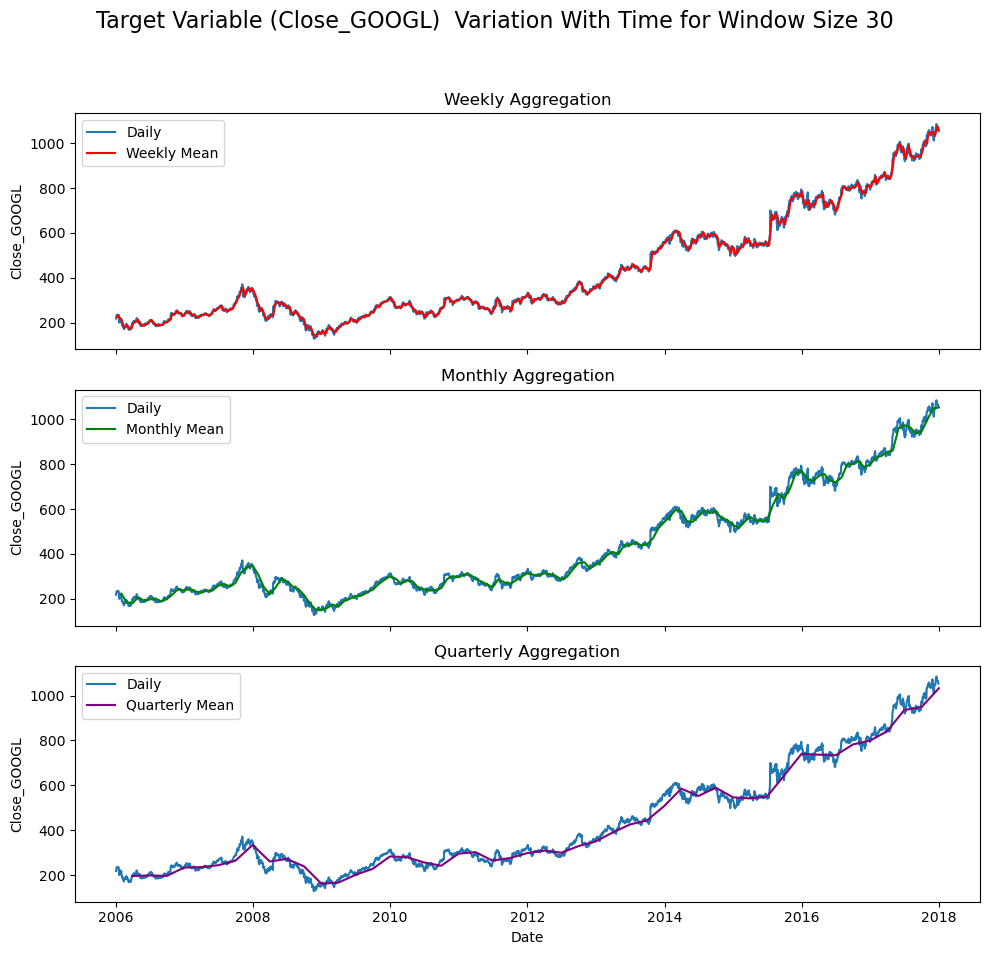

Prepared data with shape X: (2988, 30, 20), y: (2988,)


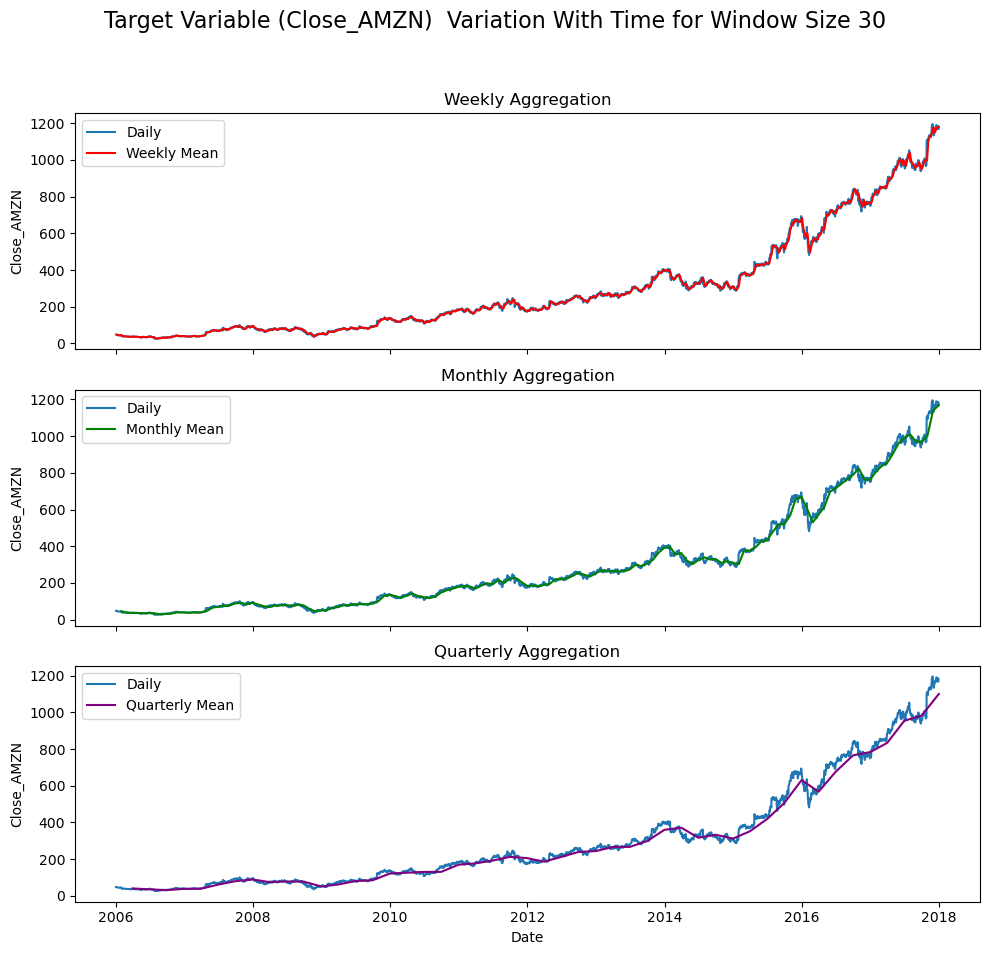

Prepared data with shape X: (2988, 30, 20), y: (2988,)


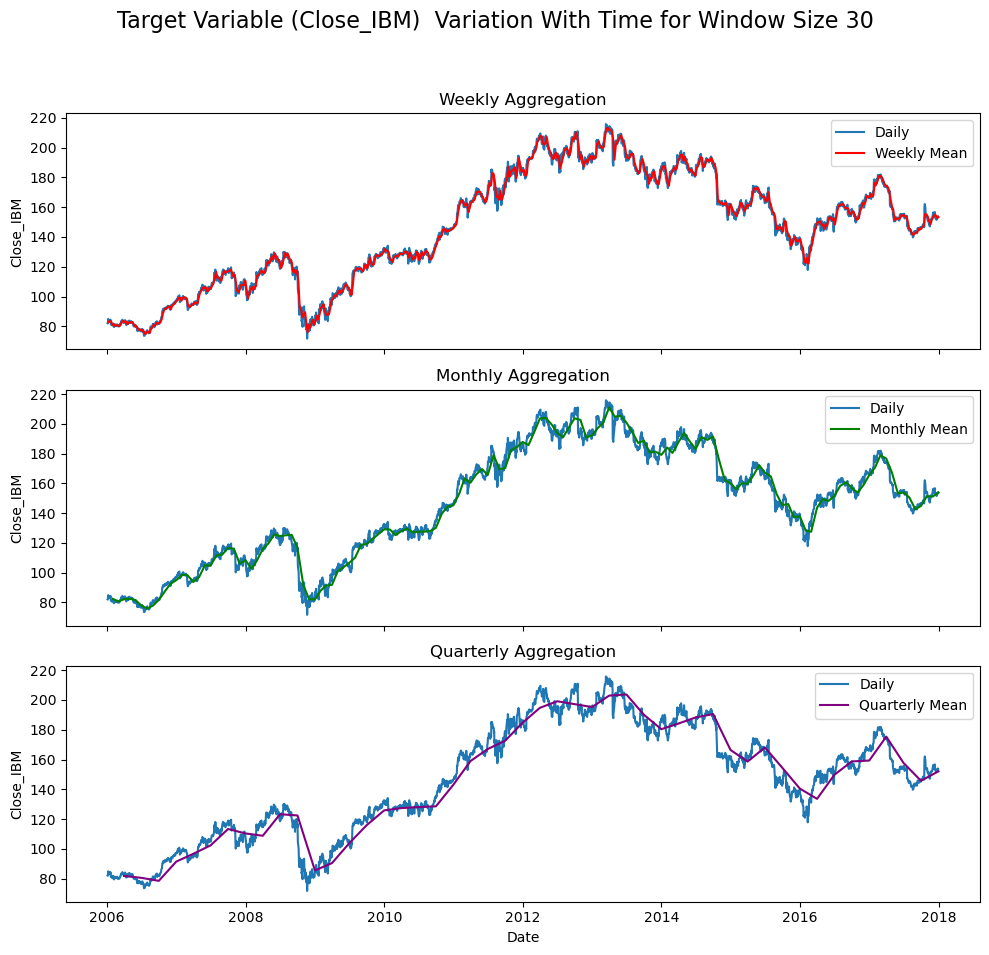

Prepared data with shape X: (2988, 30, 20), y: (2988,)


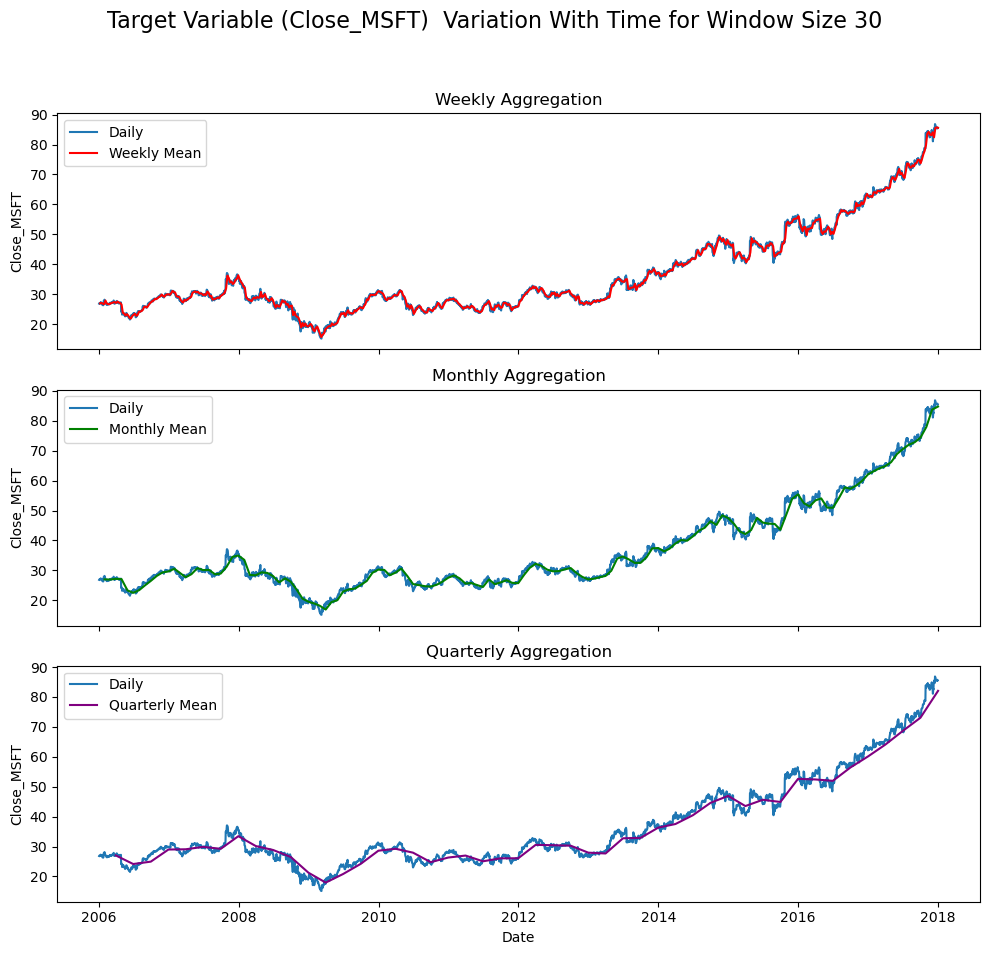

For Window size =  30

Data for stock: Close_GOOGL
X_train shape: (2390, 30, 20)
y_train shape: (2390,)
X_test shape: (598, 30, 20)
y_test shape: (598,)
avg_sample_length: 2988
For Window size =  30

Data for stock: Close_AMZN
X_train shape: (2390, 30, 20)
y_train shape: (2390,)
X_test shape: (598, 30, 20)
y_test shape: (598,)
avg_sample_length: 2988
For Window size =  30

Data for stock: Close_IBM
X_train shape: (2390, 30, 20)
y_train shape: (2390,)
X_test shape: (598, 30, 20)
y_test shape: (598,)
avg_sample_length: 2988
For Window size =  30

Data for stock: Close_MSFT
X_train shape: (2390, 30, 20)
y_train shape: (2390,)
X_test shape: (598, 30, 20)
y_test shape: (598,)
avg_sample_length: 2988


In [56]:
# We would check for different window sizes

for window_size in [3, 5, 10, 15, 20, 25, 30]:
  if df is not None:
      window_size = window_size
      stocks_to_predict = ['Close_GOOGL', 'Close_AMZN', 'Close_IBM', 'Close_MSFT']  # List of stocks to predict
      #stocks_to_predict = ['Close_AMZN']  # List of stocks to predict
      window_stride = 1
      train_test_ratio = 0.8

      data = prepare_data_for_rnn(df, window_size, stocks_to_predict, window_stride, train_test_ratio)

      if data:
          for stock, result in data.items():
              if result is not None:
                  print("For Window size = ", window_size)
                  print(f"\nData for stock: {stock}")
                  print(f"X_train shape: {result['X_train'].shape}")
                  print(f"y_train shape: {result['y_train'].shape}")
                  print(f"X_test shape: {result['X_test'].shape}")
                  print(f"y_test shape: {result['y_test'].shape}")
                  print(f"avg_sample_length: {result['avg_sample_length']}")
              else:
                  print(f"\nData for stock: {stock} is None (target column missing)")
      else:
          print("Data preparation failed.")
  else:
      print("No data to process. Please ensure data is loaded correctly.")

#### <font color = 'Brown'> For different window sizes, the trends for an individual company are the same. Google, Amazon, and Microsoft follow a similar kind of trend. IBM is slightly more volatile.

#### **1.3.5** <font color =red> [2 marks] </font>
Call the functions to create testing and training instances of predictor and target features.

Prepared data with shape X: (3015, 3, 20), y: (3015,)


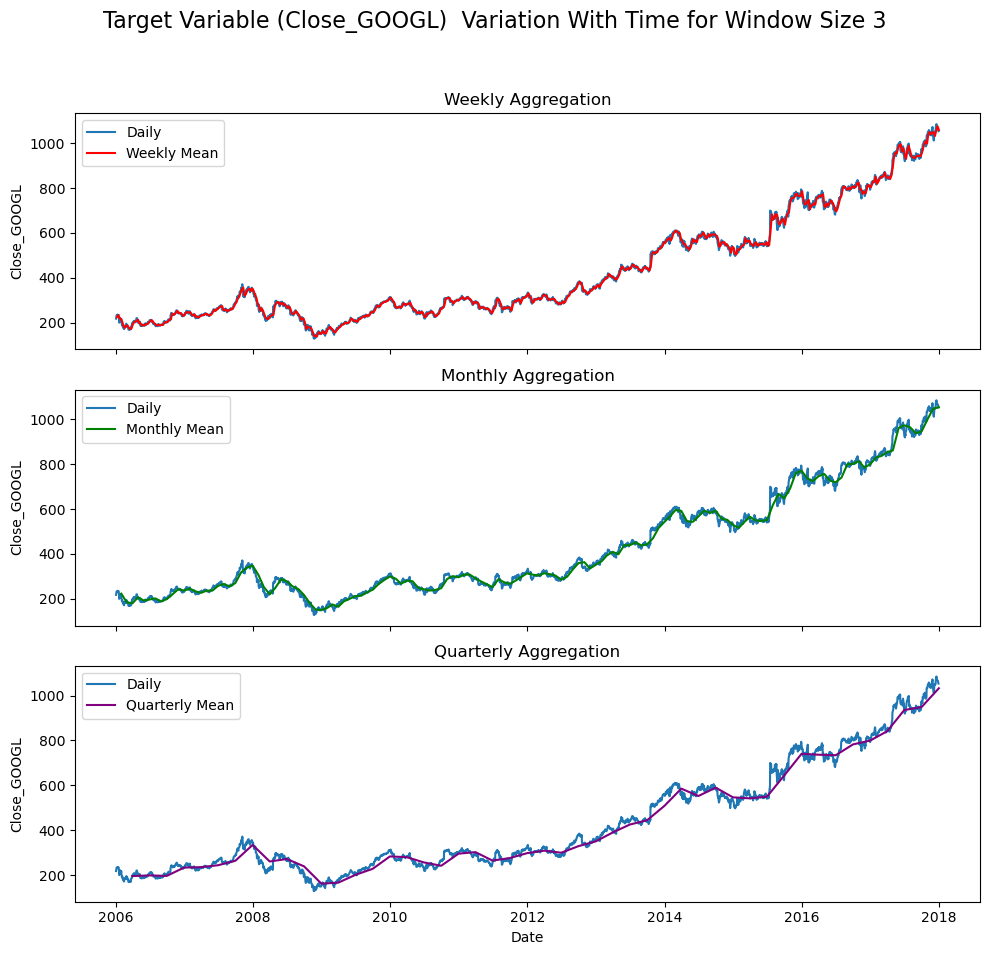

Prepared data with shape X: (3015, 3, 20), y: (3015,)


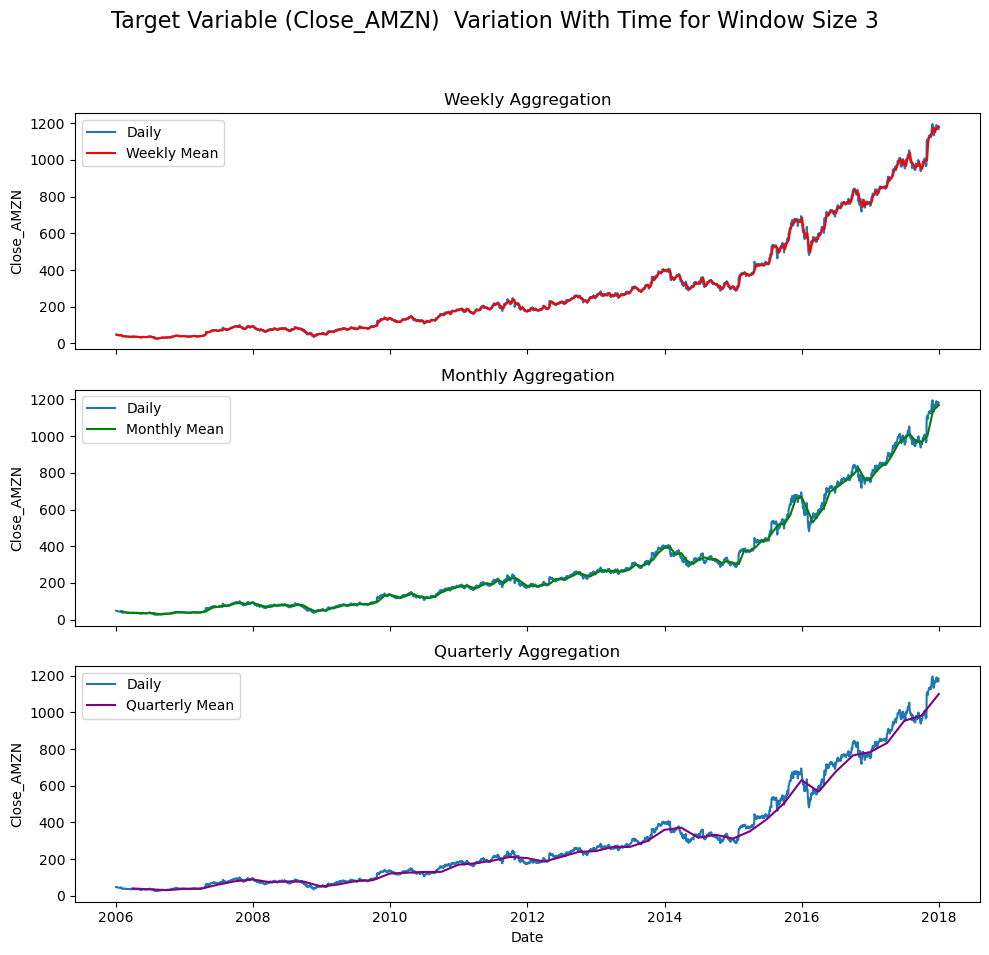

Prepared data with shape X: (3015, 3, 20), y: (3015,)


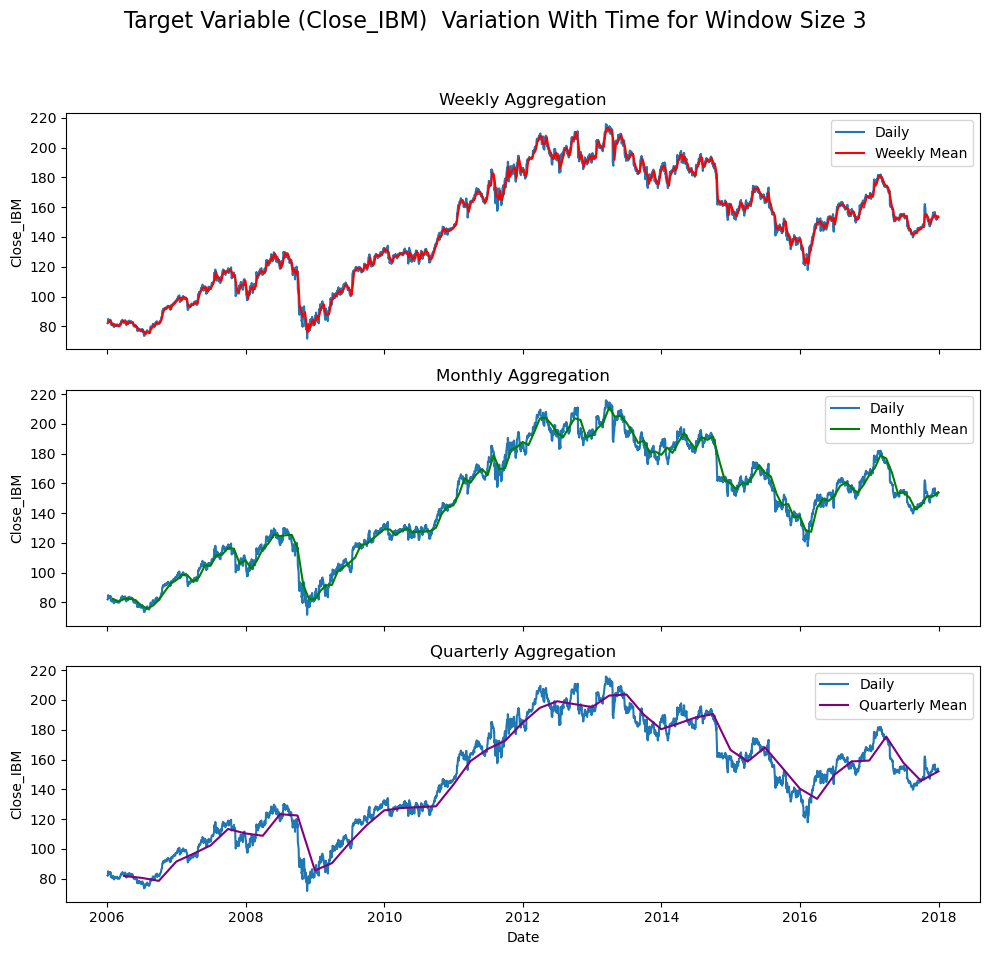

Prepared data with shape X: (3015, 3, 20), y: (3015,)


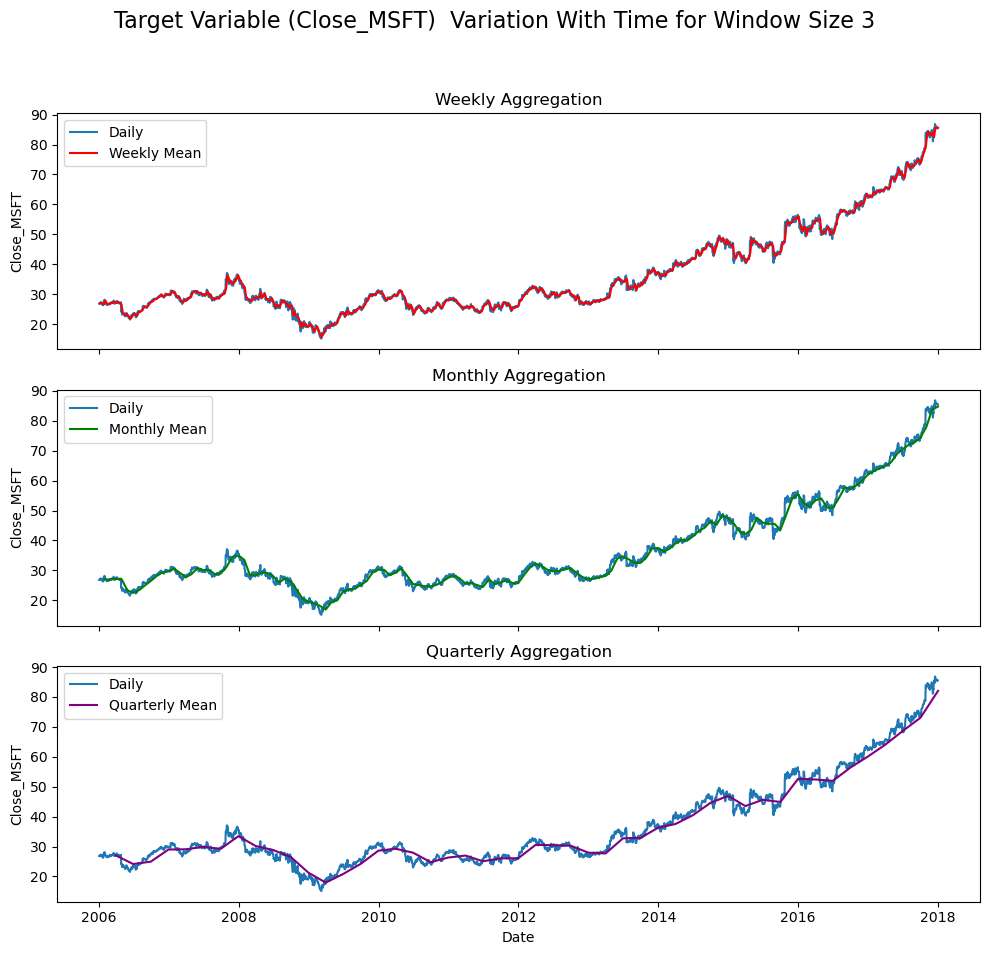

For Window size =  3

Data for stock: Close_GOOGL
Number of data Points Generated: 3015
X_train shape: (2412, 3, 20)
y_train shape: (2412,)
X_test shape: (603, 3, 20)
y_test shape: (603,)
For Window size =  3

Data for stock: Close_AMZN
Number of data Points Generated: 3015
X_train shape: (2412, 3, 20)
y_train shape: (2412,)
X_test shape: (603, 3, 20)
y_test shape: (603,)
For Window size =  3

Data for stock: Close_IBM
Number of data Points Generated: 3015
X_train shape: (2412, 3, 20)
y_train shape: (2412,)
X_test shape: (603, 3, 20)
y_test shape: (603,)
For Window size =  3

Data for stock: Close_MSFT
Number of data Points Generated: 3015
X_train shape: (2412, 3, 20)
y_train shape: (2412,)
X_test shape: (603, 3, 20)
y_test shape: (603,)


In [59]:
# Create data instances from the master data frame using the decided window size and window stride

# Using the smallest of the window lengths that were tried, as the response is almost similar

if df is not None:
      window_size = 3
      stocks_to_predict = ['Close_GOOGL', 'Close_AMZN', 'Close_IBM', 'Close_MSFT']  # List of stocks to predict
      #stocks_to_predict = ['Close_AMZN']  # List of stocks to predict
      window_stride = 1
      train_test_ratio = 0.8

      data = prepare_data_for_rnn(df, window_size, stocks_to_predict, window_stride, train_test_ratio)

      if data:
          for stock, result in data.items():
              if result is not None:
                  print("For Window size = ", window_size)
                  print(f"\nData for stock: {stock}")
                  print("Number of data Points Generated:",  result['X_train'].shape[0] + result['X_test'].shape[0])
                  print(f"X_train shape: {result['X_train'].shape}")
                  print(f"y_train shape: {result['y_train'].shape}")
                  print(f"X_test shape: {result['X_test'].shape}")
                  print(f"y_test shape: {result['y_test'].shape}")
              else:
                  print(f"\nData for stock: {stock} is None (target column missing)")
      else:
          print("Data preparation failed.")
else:
    print("No data to process. Please ensure data is loaded correctly.")

In [60]:
# Check the number of data points generated
# Done above. Result as below for window size = 3 (example)

# Prepared data with shape X: (3015, 3, 20), y: (3015,)
# number of data points generated = 3015
# X_train shape: (2412, 3, 20)
# y_train shape: (2412,)
# X_test shape: (603, 3, 20)
# y_test shape: (603,)
# For Window size =  3

**Check if the training and testing datasets are in the proper format to feed into neural networks.**

In [62]:
# Check if the datasets are compatible inputs to neural networks

def check_nn_input_compatibility(X, y, window_size, num_features):
    """
    Checks if the given data is compatible as input to a neural network.
    
    Returns:
        bool: True if the data is compatible, False otherwise.
    """
    if not isinstance(X, np.ndarray) or not isinstance(y, np.ndarray):
        print("Error: X and y must be numpy arrays.")
        return False

    if X.ndim != 3:
        print(f"Error: X must be 3-dimensional. Got {X.ndim}")
        return False
    if y.ndim != 1:
        print(f"Error: y must be 1-dimensional. Got {y.ndim}")
        return False

    if X.shape[1] != window_size or X.shape[2] != num_features:
        print(f"Error: X shape is incompatible. Expected (num_samples, {window_size}, {num_features}), got {X.shape}")
        return False

    if X.shape[0] != y.shape[0]:
        print(f"Error: X and y have different number of samples. X: {X.shape[0]}, y: {y.shape[0]}")
        return False

    if np.isnan(X).any() or np.isnan(y).any():
        print("Error: X or y contains NaN values.")
        return False

    if X.dtype not in [np.float32, np.float64]:
        print(f"Error: X has incompatible dtype: {X.dtype}.  Must be float32 or float64.")
        return False

    if y.dtype not in [np.float32, np.float64, np.int32, np.int64]:
        print(f"Error: y has incompatible dtype: {y.dtype}.  Must be numeric.")
        return False

    return True

cg = check_nn_input_compatibility(data['Close_GOOGL']['X_train'], data['Close_GOOGL']['y_train'], 3, 20)
print(cg)
ca = check_nn_input_compatibility(data['Close_AMZN']['X_train'], data['Close_AMZN']['y_train'], 3, 20)
print(ca)
ci = check_nn_input_compatibility(data['Close_IBM']['X_train'], data['Close_IBM']['y_train'], 3, 20)
print(ci)
cm = check_nn_input_compatibility(data['Close_MSFT']['X_train'], data['Close_MSFT']['y_train'], 3, 20)
print(cm)

True
True
True
True


#### <font color = "Brown"> 'True' indicates that the datasets are compatible inputs to neural networks for all the four companies

## **2 RNN Models** <font color =red> [20 marks] </font>

In this section, we will:
- Define a function that creates a simple RNN
- Tune the RNN for different hyperparameter values
- View the performance of the optimal model on the test data

### **2.1 Simple RNN Model** <font color =red> [10 marks] </font>

#### **2.1.1** <font color =red> [3 marks] </font>
Create a function that builds a simple RNN model based on the layer configuration provided.

In [68]:
# Create a function that creates a simple RNN model according to the model configuration arguments

def create_simple_rnn_model(window_size, num_features, rnn_units=50, dense_units=1,
                     dropout_rate=0.0, l2_regularization=0.0,
                     optimizer='adam', learning_rate=0.001):
    """
    Creates a simple Recurrent Neural Network (RNN) model using SimpleRNN layers.
    
    """
    model = Sequential()

    # SimpleRNN Layer
    model.add(SimpleRNN(units=rnn_units,
                       activation='relu',
                       input_shape=(window_size, num_features),
                       return_sequences=False,  # Set to True if want to stack RNNs
                       kernel_regularizer=l2(l2_regularization)  # Applying L2 regularization
                       ))
    # Dropout Layer
    if dropout_rate > 0.0:
        model.add(Dropout(dropout_rate))

    # Output Dense Layer
    model.add(Dense(units=dense_units, activation='linear',
                    kernel_regularizer=l2(l2_regularization)))  # Applying L2 regularization

    # Optimizer
    if optimizer.lower() == 'adam':
        optimizer = Adam(learning_rate=learning_rate)

    else:
        raise ValueError(f"Invalid optimizer: {optimizer}.  Must be 'adam' ")

    # Compile the model
    model.compile(optimizer=optimizer, loss='mean_squared_error')

    return model


simple_rnn = create_simple_rnn_model(window_size=3, num_features=20)
simple_rnn.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn (SimpleRNN)          │ (None, 50)             │         3,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,601 (14.07 KB)

 Trainable params: 3,601 (14.07 KB)

 Non-trainable params: 0 (0.00 B)

#### **2.1.2** <font color =red> [4 marks] </font>
Perform hyperparameter tuning to find the optimal network configuration.

In [70]:
# Find an optimal configuration of simple RNN

def find_best_configuration(X, y, num_features):
    """
    Finds the optimal hyperparameters for an RNN model using grid search and cross-validation.

    Arguments:
        X (np.array): Input data, shape (num_samples, window_size, num_features).
        y (np.array): Target values, shape (num_samples,).
        window_size (int): The size of the input window.
        num_features (int): The number of features in the input data.

    Returns:
        dict: A dictionary containing the optimal hyperparameters.
              Returns None if no optimal parameters are found.
    """

    # Define a function to evaluate the model
    def evaluate_model(model, X_test, y_test, window_size):
        """
        Evaluates the model's performance using Mean Squared Error (MSE).

        Arguments:
            model: The trained RNN model.
            X_test: Testing input data.
            y_test: Testing target values.
            window_size: The size of the input window (should be an integer).

        Returns:
                  The Mean Squared Error (MSE).
                  Returns None if an error occurs during evaluation.
        """
        try:
            # Make predictions
            predictions = model.predict(X_test)

            # Calculate MSE
            mse = mean_squared_error(y_test, predictions)
            return mse
        except Exception as e:
            print(f"Error during model evaluation: {e}")
            return None

    # Define the hyperparameter grid
    param_grid = {
        'window_size': [3, 5, 10, 20, 30],
        'rnn_units': [32, 64, 128],
        'dropout_rate': [0.0, 0.2, 0.3],
        'l2_regularization': [0.0, 0.01, 0.001],
        'optimizer': ['adam'],
        'learning_rate': [0.001, 0.0001],
        'epochs': [50],
        'validation_split': [0.2],
        'verbose': [0],        
        'use_callbacks': [True],
        'patience': [5],
        'monitor': ['val_loss'],
        'mode': ['min'],
        'filepath': ['model_checkpoint.h5'],
        'factor': [0.1],
        'min_lr': [1e-6]
    }
    grid = ParameterGrid(param_grid)

    best_mse = float('inf')
    best_hyperparameters = None
    best_model = None  # Store the best model

    # TimeSeriesSplit for cross-validation
    tscv = TimeSeriesSplit(n_splits=3)  # Use 3 splits

    for train_index, test_index in tscv.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Iterate over the hyperparameter grid
        for params in grid:
            print(f"Training with parameters: {params}")
            # Create and train the model with current hyperparameters
            model = create_simple_rnn_model(window_size=window_size,
                                     num_features=num_features,
                                     rnn_units=params['rnn_units'],
                                     dense_units=1,
                                     dropout_rate=params['dropout_rate'],
                                     l2_regularization=params['l2_regularization'],
                                     optimizer=params['optimizer'],
                                     learning_rate=params['learning_rate'])

            # Train the model
            model.fit(X_train, y_train, epochs=params['epochs'], verbose=params['verbose'], validation_split=0.2)

            if model:
                # Evaluate the model
                mse = evaluate_model(model, X_test, y_test, window_size)
                if mse is not None and mse < best_mse:
                    best_mse = mse
                    best_hyperparameters = params
                    best_model = model # Store the model

    best_model.save('simple_rnn_stock_prediction_model.keras')
    return best_hyperparameters, best_model


In [99]:
best_hyperparameters, best_model = find_best_configuration(data['Close_GOOGL']['X_train'], data['Close_GOOGL']['y_train'], 20)
best_hyperparameters

Training with parameters: {'dropout_rate': 0.0, 'epochs': 50, 'factor': 0.1, 'filepath': 'model_checkpoint.h5', 'l2_regularization': 0.0, 'learning_rate': 0.001, 'min_lr': 1e-06, 'mode': 'min', 'monitor': 'val_loss', 'optimizer': 'adam', 'patience': 5, 'rnn_units': 32, 'use_callbacks': True, 'validation_split': 0.2, 'verbose': 0, 'window_size': 3}
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
Training with parameters: {'dropout_rate': 0.0, 'epochs': 50, 'factor': 0.1, 'filepath': 'model_checkpoint.h5', 'l2_regularization': 0.0, 'learning_rate': 0.001, 'min_lr': 1e-06, 'mode': 'min', 'monitor': 'val_loss', 'optimizer': 'adam', 'patience': 5, 'rnn_units': 32, 'use_callbacks': True, 'validation_split': 0.2, 'verbose': 0, 'window_size': 5}
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 21ms/step
Training with parameters: {'dropout_rate': 0.0, 'epochs': 50, 'factor': 0.1, 'filepath': 'model_checkpoint.h5', 'l2_regularization': 0.0, 'learning_rate': 0.001, 'min_lr': 1e-06, 'mode': 'min', 'monitor': 'val_loss', 'op

{'dropout_rate': 0.0,
 'epochs': 50,
 'factor': 0.1,
 'filepath': 'model_checkpoint.h5',
 'l2_regularization': 0.01,
 'learning_rate': 0.001,
 'min_lr': 1e-06,
 'mode': 'min',
 'monitor': 'val_loss',
 'optimizer': 'adam',
 'patience': 5,
 'rnn_units': 128,
 'use_callbacks': True,
 'validation_split': 0.2,
 'verbose': 0,
 'window_size': 5}

In [95]:
# Find the best configuration based on evaluation metrics

def evaluate_model_test(model, X_test, y_test, window_size):
    """
    Evaluates the trained RNN model and prints the Mean Squared Error.
    
    """
    try:
        y_pred = model.predict(X_test)
        mse = mean_squared_error(y_test, y_pred)
        print(f"Window size: {window_size}, Mean Squared Error: {mse:.4f}")
        return mse
    except Exception as e:
        print(f"Error evaluating model: {e}")
        return None

    return mse

#### **2.1.3** <font color =red> [3 marks] </font>
Run for optimal Simple RNN Model and show final results.

In [332]:
# Create an RNN model with a combination of potentially optimal hyperparameter values and retrain the model

def create_and_train_rnn(X_train, y_train, window_size , num_features, rnn_units=64,
                         dense_units=1, dropout_rate=0.00, l2_regularization=0.00,
                         optimizer='adam', learning_rate=0.01, epochs=50,
                         validation_split=0.0, verbose=1,
                         use_callbacks=True,
                         patience=5,
                         monitor='val_loss',
                         mode='min',
                         filepath= 'stock_pred_Assignment.keras',   
                         factor=0.1,
                         batch_size = 32,
                         min_lr=1e-6,
                        ):
    """
    Creates and trains a simple Recurrent Neural Network (RNN) model.
    
    """
    try:
        model = Sequential()
        model.add(SimpleRNN(units=rnn_units,
                       activation='relu',
                       input_shape=(window_size, num_features),
                       return_sequences=False,
                       kernel_regularizer=l2(l2_regularization)
                       ))
        if dropout_rate > 0.0:
            model.add(Dropout(dropout_rate))
        model.add(Dense(units=dense_units,
                        kernel_regularizer=l2(l2_regularization)))


        # Optimizer
        if optimizer.lower() == 'adam':
            optimizer = Adam(learning_rate=learning_rate)

        else:
            raise ValueError(f"Invalid optimizer: {optimizer}.  Must be 'adam'.")

        model.compile(optimizer=optimizer, loss='mean_squared_error')

        # Train the model
        model.fit(X_train, y_train, epochs=50, verbose=1, validation_split=0.0)

        callbacks = []
        if use_callbacks:
            # EarlyStopping
            early_stopping = EarlyStopping(monitor=monitor,
                                            patience=patience,
                                            mode=mode,
                                            restore_best_weights=True,
                                            verbose=verbose)
            callbacks.append(early_stopping)

            # ModelCheckpoint
            model_checkpoint = ModelCheckpoint(filepath=filepath,
                                                monitor=monitor,
                                                mode=mode,
                                                save_best_only=True,
                                                verbose=verbose)
            callbacks.append(model_checkpoint)

            # ReduceLROnPlateau
            reduce_lr = ReduceLROnPlateau(monitor=monitor,
                                            factor=factor,
                                            patience=patience // 2,  # typically less than EarlyStopping
                                            mode=mode,
                                            min_lr=min_lr,
                                            verbose=verbose)
            callbacks.append(reduce_lr)

        history = model.fit(X_train, y_train, epochs=epochs, verbose=verbose,
                            validation_split=validation_split,
                            callbacks=callbacks if use_callbacks else [])
        return model
    except Exception as e:
        print(f"Error creating/training RNN: {e}")
        return None

simple_rnn1 = create_and_train_rnn(data['Close_GOOGL']['X_train'], data['Close_GOOGL']['y_train'], 20, 20)
simple_rnn1.summary()

Epoch 1/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 20335.4746
Epoch 2/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 7482.1289
Epoch 3/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1991.6595
Epoch 4/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 1010.7978
Epoch 5/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 924.7470
Epoch 6/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 738.2731
Epoch 7/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 980.3145
Epoch 8/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 559.8926
Epoch 9/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 594.8636
Epoch 10/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 508.0042
Epoch 11/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 552.6568
Epoch 12/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 450.1007
Epoch 13/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 406.7280
Epoch 14/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 550.8122
Epoch 15/50
76/76 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step -

Model: "sequential_109"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn_136 (SimpleRNN)      │ (None, 64)             │         5,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_109 (Dense)               │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,517 (64.52 KB)

 Trainable params: 5,505 (21.50 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,012 (43.02 KB)

Plotting the actual vs predicted values

19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step


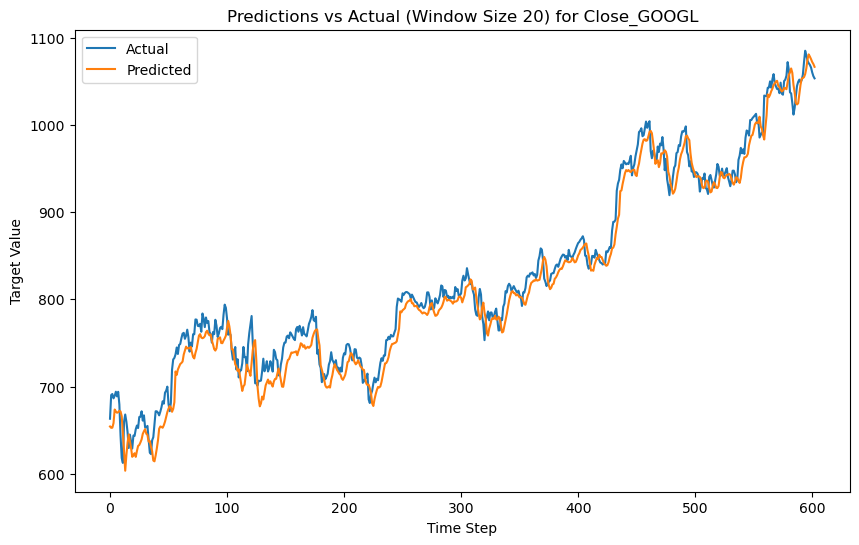

In [334]:
# Predict on the test data and plot

def plot_predictions(y_test, y_pred, window_size, stock_name):
    """
    Plots the predicted and actual values.

    """
    plt.figure(figsize=(10, 6))
    plt.plot(y_test, label='Actual')
    plt.plot(y_pred, label='Predicted')
    plt.title(f'Predictions vs Actual (Window Size {window_size}) for {stock_name}')
    plt.xlabel('Time Step')
    plt.ylabel('Target Value')
    plt.legend()
    plt.show()


y_pred = simple_rnn1.predict(data['Close_GOOGL']['X_test']) 

plot_predictions(data['Close_GOOGL']['y_test'], y_pred, 20, 'Close_GOOGL')

It is worth noting that every training session for a neural network is unique. So, the results may vary slightly each time you retrain the model.

In [336]:
# Compute the performance of the model on the testing data set

evaluate_model_test(simple_rnn1, data['Close_GOOGL']['X_test'], data['Close_GOOGL']['y_test'], 20)


19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 
Window size: 20, Mean Squared Error: 377.6740


377.67404963386326

### **2.2 Advanced RNN Models** <font color =red> [10 marks] </font>

In this section, we will:
- Create an LSTM or a GRU network
- Tune the network for different hyperparameter values
- View the performance of the optimal model on the test data

#### **2.2.1** <font color =red> [3 marks] </font>
Create a function that builds an advanced RNN model with tunable hyperparameters.

In [110]:
# # Define a function to create a model and specify default values for hyperparameters

def create_lstm_model(window_size, num_features, lstm_units=50, dense_units=1,
                     dropout_rate=0.0, l2_regularization=0.0,
                     optimizer='adam', learning_rate=0.001):
    """
    Creates an LSTM model.

    Arguments:
        window_size (int): The size of the input window (sequence length).
        num_features (int): The number of features in the input data.
        lstm_units (int, optional): Number of units in the LSTM layer. Defaults to 50.
        dense_units (int, optional): Number of units in the output Dense layer. Defaults to 1.
        dropout_rate (float, optional): Dropout rate for regularization. Defaults to 0.0 (no dropout).
        l2_regularization (float, optional): L2 regularization strength.
        optimizer (str):  Defaults to 'adam'.
        learning_rate (float): Defaults to 0.001
    
    """
    model = Sequential()
    model.add(LSTM(units=lstm_units,
                   activation='relu',
                   input_shape=(window_size, num_features),
                   return_sequences=False,
                   kernel_regularizer=l2(l2_regularization)
                   ))
    if dropout_rate > 0.0:
        model.add(Dropout(dropout_rate))
    model.add(Dense(units=dense_units,
                    kernel_regularizer=l2(l2_regularization)))

    # Output Dense Layer
    model.add(Dense(units=dense_units, activation='linear',
                    kernel_regularizer=l2(l2_regularization)))  # Applying L2 regularization


    # Optimizer
    if optimizer.lower() == 'adam':
        optimizer = Adam(learning_rate=learning_rate)
    else:
        raise ValueError(f"Invalid optimizer: {optimizer}.  Must be 'adam'.")

    model.compile(optimizer=optimizer, loss='mean_squared_error')
    return model

LSTM_rnn = create_lstm_model(window_size=3, num_features=20)
LSTM_rnn.summary()

Model: "sequential_813"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 50)             │        14,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_813 (Dense)               │ (None, 1)              │            51 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_814 (Dense)               │ (None, 1)              │             2 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,253 (55.68 KB)

 Trainable params: 14,253 (55.68 KB)

 Non-trainable params: 0 (0.00 B)

#### **2.2.2** <font color =red> [4 marks] </font>
Perform hyperparameter tuning to find the optimal network configuration.

In [112]:
# Find an optimal configuration

def find_best_configuration_LSTM(X, y, num_features):
    """
    Finds the optimal hyperparameters for an RNN model using grid search and cross-validation.

    Arguments:
        X (np.array): Input data, shape (num_samples, window_size, num_features).
        y (np.array): Target values, shape (num_samples,).
        window_size (int): The size of the input window.
        num_features (int): The number of features in the input data.

    Returns:
        dict: A dictionary containing the optimal hyperparameters.
              Returns None if no optimal parameters are found.
    """

    # Define a function to evaluate the model
    def evaluate_model_LSTM(model, X_test, y_test, window_size):
        """
        Evaluates the model's performance using Mean Squared Error (MSE).

        Arguments:
            model: The trained RNN model.
            X_test (np.array): Testing input data.
            y_test (np.array): Testing target values.
            window_size (int): The size of the input window.

        Returns:
            float: The Mean Squared Error (MSE).
                  Returns None if an error occurs during evaluation.
        """
        try:
            # Make predictions
            predictions = model.predict(X_test)

            # Calculate MSE
            mse = mean_squared_error(y_test, predictions)
            return mse
        except Exception as e:
            print(f"Error during model evaluation: {e}")
            return None

    # Define the hyperparameter grid
    param_grid = {
        'window_size': [3, 5, 10, 20, 30],
        #'batch_size': [32, 64],
        'lstm_units': [32, 64, 128],
        'dropout_rate': [0.0, 0.2, 0.3],
        'l2_regularization': [0.0, 0.01, 0.001],
        'optimizer': ['adam'],
        'learning_rate': [0.001, 0.0001],
        'epochs': [50],  # Reduced epochs for faster search
        'validation_split': [0.2],
        'verbose': [0],
        'use_callbacks': [True],
        'patience': [5],
        'monitor': ['val_loss'],
        'mode': ['min'],
        'filepath': ['stock_pred_Assignment.keras'],
        'factor': [0.1],
        'min_lr': [1e-6]
    }
    grid = ParameterGrid(param_grid)

    best_mse = float('inf')
    best_hyperparameters = None
    best_model = None  # Store the best model

    # TimeSeriesSplit for cross-validation
    tscv = TimeSeriesSplit(n_splits=3)  # Use 3 splits

    for train_index, test_index in tscv.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]

        # Iterate over the hyperparameter grid
        for params in grid:
            print(f"Training with parameters: {params}")
            # Create and train the model with current hyperparameters
            model = create_lstm_model(window_size=window_size,
                                     num_features=num_features,
                                     lstm_units=params['lstm_units'],
                                     dropout_rate=params['dropout_rate'],
                                     l2_regularization=params['l2_regularization'],
                                     optimizer=params['optimizer'],
                                     learning_rate=params['learning_rate'])

            # Train the model
            model.fit(X_train, y_train, epochs=params['epochs'], verbose = params['verbose'], validation_split = 0.2)

            # Evaluate the model
            mse = evaluate_model_LSTM(model, X_test, y_test, window_size)
            if mse is not None and mse < best_mse:
                best_mse = mse
                best_hyperparameters = params
                best_model = model

    best_model.save('LSTM_stock_prediction_model.keras')
    return best_hyperparameters, best_model

In [113]:
best_hyperparameters_LSTM, best_model_LSTM = find_best_configuration_LSTM(data['Close_GOOGL']['X_train'], data['Close_GOOGL']['y_train'], 20)
best_hyperparameters_LSTM

Training with parameters: {'dropout_rate': 0.0, 'epochs': 50, 'factor': 0.1, 'filepath': 'stock_pred_Assignment.keras', 'l2_regularization': 0.0, 'learning_rate': 0.001, 'lstm_units': 32, 'min_lr': 1e-06, 'mode': 'min', 'monitor': 'val_loss', 'optimizer': 'adam', 'patience': 5, 'use_callbacks': True, 'validation_split': 0.2, 'verbose': 0, 'window_size': 3}
19/19 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step
Training with parameters: {'dropout_rate': 0.0, 'epochs': 50, 'factor': 0.1, 'filepath': 'stock_pred_Assignment.keras', 'l2_regularization': 0.0, 'learning_rate': 0.001, 'lstm_units': 32, 'min_lr': 1e-06, 'mode': 'min', 'monitor': 'val_loss', 'optimizer': 'adam', 'patience': 5, 'use_callbacks': True, 'validation_split': 0.2, 'verbose': 0, 'window_size': 5}
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
Training with parameters: {'dropout_rate': 0.0, 'epochs': 50, 'factor': 0.1, 'filepath': 'stock_pred_Assignment.keras', 'l2_regularization': 0.0, 'learning_rate': 0.001, 'lstm_units': 32, 'min_lr': 1e-0

{'dropout_rate': 0.2,
 'epochs': 50,
 'factor': 0.1,
 'filepath': 'stock_pred_Assignment.keras',
 'l2_regularization': 0.0,
 'learning_rate': 0.001,
 'lstm_units': 32,
 'min_lr': 1e-06,
 'mode': 'min',
 'monitor': 'val_loss',
 'optimizer': 'adam',
 'patience': 5,
 'use_callbacks': True,
 'validation_split': 0.2,
 'verbose': 0,
 'window_size': 20}

#### **2.2.3** <font color =red> [3 marks] </font>
Run for optimal RNN Model and show final results.

In [115]:
# Create the model with a combination of potentially optimal hyperparameter values and retrain the model

def create_and_train_lstm(X_train, y_train, window_size, num_features, rnn_units=64,
                         dense_units=1, dropout_rate=0.0, l2_regularization=0.001,
                         optimizer='adam', learning_rate=0.1,
                         verbose=0,
                         use_callbacks=True,
                         patience=5,
                         monitor='val_loss',
                         mode='min',
                         filepath='stock_pred_Assignment.keras',
                         factor=0.1,
                         min_lr=1e-6,
                         epochs = 50,
                         batch_size =32,
                         ):
    """
    Creates and trains a simple Recurrent Neural Network (RNN) model.

    Returns:
        tensorflow.keras.Model: The trained RNN model, or None on error.
    """
    try:
        model = Sequential()
        model.add(LSTM(units=rnn_units,
                       activation='relu',
                       input_shape=(window_size, num_features),
                       return_sequences=False,
                       kernel_regularizer=l2(l2_regularization)
                       ))
        if dropout_rate > 0.0:
            model.add(Dropout(dropout_rate))
        model.add(Dense(units=dense_units,
                        kernel_regularizer=l2(l2_regularization)))

        # Optimizer
        if optimizer.lower() == 'adam':
            optimizer = Adam(learning_rate=learning_rate)

        else:
            raise ValueError(f"Invalid optimizer: {optimizer}.  Must be 'adam'.")

        model.compile(optimizer=optimizer, loss='mean_squared_error')

        callbacks = []
        if use_callbacks:
            # EarlyStopping
            early_stopping = EarlyStopping(monitor=monitor,
                                            patience=patience,
                                            mode=mode,
                                            restore_best_weights=True,
                                            verbose=verbose)
            callbacks.append(early_stopping)

            # ModelCheckpoint
            model_checkpoint = ModelCheckpoint(filepath=filepath,
                                                monitor=monitor,
                                                mode=mode,
                                                save_best_only=True,
                                                verbose=verbose)
            callbacks.append(model_checkpoint)

            # ReduceLROnPlateau
            reduce_lr = ReduceLROnPlateau(monitor=monitor,
                                            factor=factor,
                                            patience=patience // 2,  # typically less than EarlyStopping
                                            mode=mode,
                                            min_lr=min_lr,
                                            verbose=verbose)
            callbacks.append(reduce_lr)

        
        return model
    except Exception as e:
        print(f"Error creating/training RNN: {e}")
        return None



In [116]:
lstm_pre = create_and_train_lstm(data['Close_GOOGL']['X_train'], data['Close_GOOGL']['y_train'], 20, 20)
lstm_pre.summary()

Model: "sequential_1624"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_811 (LSTM)                 │ (None, 64)             │        21,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2435 (Dense)              │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 21,825 (85.25 KB)

 Trainable params: 21,825 (85.25 KB)

 Non-trainable params: 0 (0.00 B)

In [379]:
lstm_pre_trained = lstm_pre.fit(data['Close_GOOGL']['X_train'], data['Close_GOOGL']['y_train'],
                                epochs = 50, batch_size = 64, validation_split = 0.25)

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - loss: 97.1509 - val_loss: 641.8326
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 133.4983 - val_loss: 314.1874
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - loss: 100.2099 - val_loss: 219.6877
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 93.9238 - val_loss: 385.5938
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 98.3195 - val_loss: 216.9648
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 100.5758 - val_loss: 241.4417
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 86.2059 - val_loss: 220.9496
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 90.1329 - val_loss: 236.2344
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - loss: 93.8592 - val_loss: 218.8313
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 91.3812 - val_loss: 216.0243
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 88.5617 - val_loss: 627.3671
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━━━━━━

In [317]:
# Compute the performance of the model on the testing data set

def evaluate_model_test_LSTM1(model, X_test, y_test, window_size):
    """
    Evaluates the trained RNN model and prints the Mean Squared Error.
    
    """
    try:
        y_pred = model.predict(X_test)
        #mse = mean_squared_error(y_test, y_pred).numpy()
        mse = mean_squared_error(y_test, y_pred)
        print(f"Window size: {window_size}, Mean Squared Error: {mse:.4f}")
        return mse
    except Exception as e:
        print(f"Error evaluating model: {e}")
        return None

    return mse


Plotting the actual vs predicted values

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


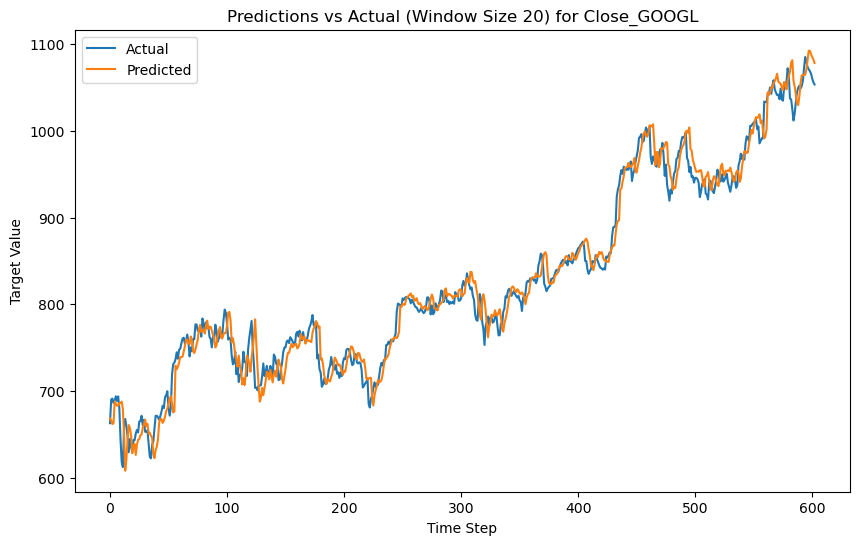

In [383]:
# Predict on the test data

def plot_predictions_LSTM(y_test, y_pred, window_size, stock_name):
    """
    Plots the predicted and actual values.

    """
    plt.figure(figsize=(10, 6))
    plt.plot(y_test, label='Actual')
    plt.plot(y_pred, label='Predicted')
    plt.title(f'Predictions vs Actual (Window Size {window_size}) for {stock_name}')
    plt.xlabel('Time Step')
    plt.ylabel('Target Value')
    plt.legend()
    plt.show()

y_pred1 = lstm_pre.predict(data['Close_GOOGL']['X_test']) # Calculate y_pred before plotting

plot_predictions_LSTM(data['Close_GOOGL']['y_test'], y_pred1, 20, 'Close_GOOGL')

In [381]:
evaluate_model_test_LSTM1(lstm_pre, data['Close_GOOGL']['X_test'], data['Close_GOOGL']['y_test'], 20)

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
Window size: 20, Mean Squared Error: 336.6909


336.6908749281696

## **3 Predicting Multiple Target Variables** <font color =red> [OPTIONAL] </font>

In this section, we will use recurrent neural networks to predict stock prices for more than one company.

### **3.1 Data Preparation**

#### **3.1.1**
Create testing and training instances for multiple target features.

You can take the closing price of all four companies to predict here.

In [249]:
# Create data instances from the master data frame using a window size of 65, a window stride of 5 and a test size of 20%
# Specify the list of stock names whose 'Close' values you wish to predict using the 'target_names' parameter

def create_data_instances(df, target_names, window_size = 65, window_stride = 5, test_size = 0.2):


    if 'Date' not in df.columns:
        raise ValueError("DataFrame must have a 'Date' column.")

    df = df.sort_values(by='Date').reset_index(drop=True)

    # Identify feature columns (all columns except 'Date')
    feature_cols = [col for col in df.columns if col != 'Date']
    X = df[feature_cols].values
    dates = df['Date'].values

    # Identify target 'Close' price columns
    target_cols = [stock for stock in target_names]
    if not all(col in df.columns for col in target_cols):
        missing_targets = [col for col in target_cols if col not in df.columns]
        raise ValueError(f"Target columns not found in DataFrame: {missing_targets}")
    y = df[target_cols].values

    X_sequences = []
    y_sequences = []
    date_sequences = []

    for i in range(0, len(df) - window_size, window_stride):
        X_sequences.append(X[i:i + window_size])
        y_sequences.append(y[i + window_size])  # The target is the 'Close' price after the window
        date_sequences.append(dates[i + window_size])

    X_sequences = np.array(X_sequences)
    y_sequences = np.array(y_sequences)
    date_sequences = np.array(date_sequences)

    # Split the data into training and testing sets
    train_dates, test_dates, X_train, X_test, y_train, y_test = train_test_split(
        date_sequences, X_sequences, y_sequences, test_size=test_size, shuffle=False
    )

    return X_train, y_train, X_test, y_test


In [128]:
X_train, y_train, X_test, y_test = create_data_instances(df, ['Close_GOOGL', 'Close_MSFT', 'Close_IBM', 'Close_AMZN'])
print("Shape of X_train:", X_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of X_test:", X_test.shape)
print("Shape of y_test:", y_test.shape)

Shape of X_train: (472, 65, 20)
Shape of y_train: (472, 4)
Shape of X_test: (119, 65, 20)
Shape of y_test: (119, 4)


In [129]:
# Check the number of data points generated

num_data_points = X_train.shape[0] + X_test.shape[0]
print("Total number of data points generated:", num_data_points)
print("Number of training data points:", X_train.shape[0])
print("Number of testing data points:", X_test.shape[0])

Total number of data points generated: 591
Number of training data points: 472
Number of testing data points: 119


### **3.2 Run RNN Models**

#### **3.2.1**
Perform hyperparameter tuning to find the optimal network configuration for Simple RNN model.

In [132]:
# Find an optimal configuration of simple RNN

In [267]:
def build_rnn_model(params, input_shape, output_shape):
    """
    Builds a Simple RNN model based on the provided hyperparameters.
    """
    model = Sequential()
    model.add(SimpleRNN(units=int(params['units']),
                       activation=params['activation'],
                       return_sequences=params['n_layers'] > 1,
                       input_shape=input_shape))
    if params['dropout'] > 0:
        model.add(Dropout(params['dropout']))
    for i in range(int(params['n_layers']) - 1):
        model.add(SimpleRNN(units=int(params['units']),
                           activation=params['activation'],
                           return_sequences=i < int(params['n_layers']) - 2))
        if params['dropout'] > 0:
            model.add(Dropout(params['dropout']))
    model.add(Dense(output_shape))
    optimizer = Adam(learning_rate=params['learning_rate'])
    model.compile(optimizer=optimizer, loss='mse')
    return model

In [263]:
def objective(params):
    """
    Objective function to be minimized by Hyperopt (returns validation loss).
    """
    model = build_rnn_model(params, X_train.shape[1:], y_train.shape[1])
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    history = model.fit(X_train, y_train,
                        epochs=50,  # Adjust as needed
                        batch_size=int(params['batch_size']),
                        validation_split=0.2,
                        callbacks=[early_stopping],
                        verbose=0)
    # Return the minimum validation loss achieved during training
    print(params)
    return np.min(history.history['val_loss'])

In [259]:
master_df = df
target_stocks = ['Close_GOOGL', 'Close_MSFT', 'Close_IBM', 'Close_AMZN']
window_size = 65
window_stride = 5
test_size = 0.2

X_train_unscaled, y_train_unscaled, X_test_unscaled, y_test_unscaled = create_data_instances(
        master_df.copy(),
        target_names=target_stocks,
        window_size=window_size,
        window_stride=window_stride,
        test_size=test_size
    )

In [269]:
# Find the best configuration

# Seed for reproducibility
np.random.seed(42)
random.seed(42)

# Scale the data
scaler_x = MinMaxScaler()
X_train = scaler_x.fit_transform(X_train_unscaled.reshape(-1, X_train_unscaled.shape[-1])).reshape(X_train_unscaled.shape)
X_test = scaler_x.transform(X_test_unscaled.reshape(-1, X_test_unscaled.shape[-1])).reshape(X_test_unscaled.shape)

scaler_y = MinMaxScaler()
y_train = scaler_y.fit_transform(y_train_unscaled)
y_test = scaler_y.transform(y_test_unscaled)

# Define the hyperparameter search space
space = {
        'units': hp.choice('units', [32, 64, 128]),
        'n_layers': hp.choice('n_layers', [1, 2, 3]),
        'activation': hp.choice('activation', ['tanh', 'relu']),
        'dropout': hp.uniform('dropout', 0, 0.5),
        'learning_rate': hp.loguniform('learning_rate', -4, -2),  # log scale for learning rate
        'batch_size': hp.choice('batch_size', [32, 64, 128]),
    }

# Run Hyperopt to find the best hyperparameters
trials = Trials()
best = fmin(fn=objective,
                space=space,
                algo=tpe.suggest,
                max_evals=50,  # Number of hyperparameter combinations to try
                trials=trials)

print("\nBest Hyperparameters found by Hyperopt:")
print(best)    

{'activation': 'relu', 'batch_size': 64, 'dropout': 0.16931477607218637, 'learning_rate': 0.13511747746156022, 'n_layers': 2, 'units': 64}
{'activation': 'tanh', 'batch_size': 128, 'dropout': 0.2503921289965051, 'learning_rate': 0.02585395846100467, 'n_layers': 2, 'units': 32}
{'activation': 'tanh', 'batch_size': 128, 'dropout': 0.3759037633039363, 'learning_rate': 0.030607325430384243, 'n_layers': 2, 'units': 128}
{'activation': 'tanh', 'batch_size': 32, 'dropout': 0.08760940398638123, 'learning_rate': 0.10384303944873836, 'n_layers': 3, 'units': 64}
{'activation': 'relu', 'batch_size': 64, 'dropout': 0.08606029912438279, 'learning_rate': 0.0794595359485479, 'n_layers': 3, 'units': 64}
{'activation': 'tanh', 'batch_size': 32, 'dropout': 0.4499993445610226, 'learning_rate': 0.0833103026851765, 'n_layers': 2, 'units': 64}
{'activation': 'tanh', 'batch_size': 128, 'dropout': 0.3129404501138603, 'learning_rate': 0.03390637930175614, 'n_layers': 2, 'units': 64}
{'activation': 'tanh', 'batc

In [291]:
# Create an RNN model with a combination of potentially optimal hyperparameter values and retrain the

best1 = {'activation': 'relu', 'batch_size': 128, 'dropout': 0.00,
         'learning_rate': 0.01, 'n_layers': 1, 'units': 64}

optimal_model = build_rnn_model(best1, X_train.shape[1:], y_train.shape[1])
om = optimal_model.fit(X_train, y_train, epochs=50, batch_size=int(best1['batch_size']), verbose=1)
optimal_model.summary()

Epoch 1/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - loss: 0.1457
Epoch 2/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0161
Epoch 3/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0097
Epoch 4/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.0063
Epoch 5/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0042
Epoch 6/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0033
Epoch 7/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.0019
Epoch 8/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0015
Epoch 9/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 0.0012
Epoch 10/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step - loss: 0.0010
Epoch 11/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 8.2864e-04
Epoch 12/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 7.6380e-04
Epoch 13/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 7.5597e-04
Epoch 14/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step - loss: 6.6271e-04
Epoch 15/50
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step - loss: 6.0643e-04
Epoch 16/50
4/

Model: "sequential_1743"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn_919 (SimpleRNN)      │ (None, 64)             │         5,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2554 (Dense)              │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 17,102 (66.81 KB)

 Trainable params: 5,700 (22.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 11,402 (44.54 KB)

In [293]:
# Compute the performance of the model on the testing data set

y_pred = optimal_model.predict(X_test)

# Inverse transform the predictions and actual values to the original scale
y_pred_original = scaler_y.inverse_transform(y_pred)
y_test_original = scaler_y.inverse_transform(y_test)

mse = mean_squared_error(y_test_original, y_pred_original)
print(f"\nMean Squared Error on Test Set with Optimal Model: {mse:.4f}")

4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step

Mean Squared Error on Test Set with Optimal Model: 114.1899


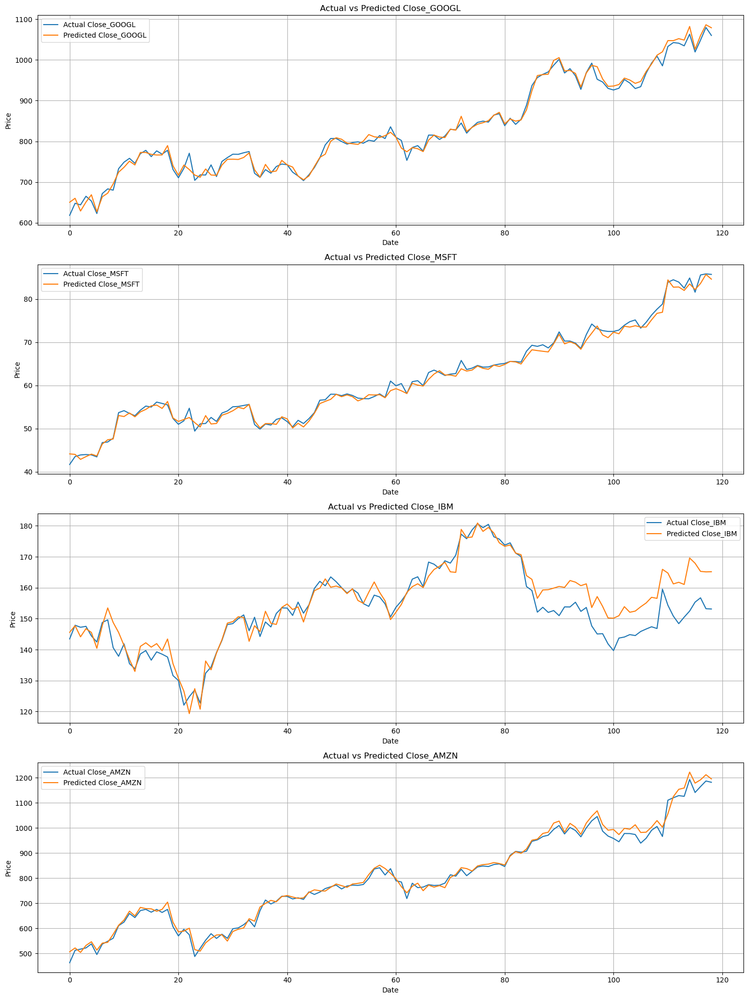

In [295]:
# Plotting the actual vs predicted values for all targets

num_targets = y_test_original.shape[1]
plt.figure(figsize=(15, 5 * num_targets))
for i in range(num_targets):
    plt.subplot(num_targets, 1, i + 1)
    plt.plot(y_test_original[:, i], label=f'Actual {target_stocks[i]}')
    plt.plot(y_pred_original[:, i], label=f'Predicted {target_stocks[i]}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title(f'Actual vs Predicted {target_stocks[i]}')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

#### **3.2.2**
Perform hyperparameter tuning to find the optimal network configuration for Advanced RNN model.

In [142]:
# Find an optimal configuration of an advanced RNN

def build_lstm_model(params, input_shape, output_shape):
    """
    Builds an LSTM model based on the provided hyperparameters.
    """
    model = Sequential()
    model.add(LSTM(units=int(params['units']),
                      activation=params['activation'],
                      return_sequences=params['n_layers'] > 1,
                      input_shape=input_shape))
    if params['dropout'] > 0:
        model.add(Dropout(params['dropout']))
    for i in range(int(params['n_layers']) - 1):
        model.add(LSTM(units=int(params['units']),
                           activation=params['activation'],
                           return_sequences=i < int(params['n_layers']) - 2))
        if params['dropout'] > 0:
            model.add(Dropout(params['dropout']))
    model.add(Dense(output_shape))
    optimizer = Adam(learning_rate=params['learning_rate'])
    model.compile(optimizer=optimizer, loss='mse')
    return model

In [143]:
def objective1(params, X_train, y_train):
    """
    Objective function to be minimized by Hyperopt (returns validation loss).
    """
    model = build_lstm_model(params, X_train.shape[1:], y_train.shape[1])
    early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    history = model.fit(X_train, y_train,
                        epochs=50,  
                        batch_size=int(params['batch_size']),
                        validation_split=0.2,
                        callbacks=[early_stopping],
                        verbose=0)
    # Return the minimum validation loss achieved during training
    return np.min(history.history['val_loss'])

In [144]:
# Find the best configuration

# Seed for reproducibility
np.random.seed(42)
random.seed(42)

# Scale the data
scaler_x = MinMaxScaler()
X_train = scaler_x.fit_transform(X_train_unscaled.reshape(-1, X_train_unscaled.shape[-1])).reshape(X_train_unscaled.shape)
X_test = scaler_x.transform(X_test_unscaled.reshape(-1, X_test_unscaled.shape[-1])).reshape(X_test_unscaled.shape)

scaler_y = MinMaxScaler()
y_train = scaler_y.fit_transform(y_train_unscaled)
y_test = scaler_y.transform(y_test_unscaled)

# Define the hyperparameter search space
space = {
        'units': hp.choice('units', [32, 64, 128]),
        'n_layers': hp.choice('n_layers', [1, 2, 3]),
        'activation': hp.choice('activation', ['relu']),
        'dropout': hp.uniform('dropout', 0, 0.1),
        'learning_rate': hp.loguniform('learning_rate', -4, -2),  # log scale for learning rate
        'batch_size': hp.choice('batch_size', [32, 64, 128]),
        
    }

# Partial the objective function to pass X_train and y_train
objective_partial = partial(objective1, X_train=X_train, y_train=y_train)

# Run Hyperopt to find the best hyperparameters
trials = Trials()
best2 = fmin(fn=objective_partial,
                space=space,
                algo=tpe.suggest,
                max_evals=50,  # Number of hyperparameter combinations to try
                trials=trials)

print("\nBest Hyperparameters found by Hyperopt:")
print(best2)

100%|██████████| 50/50 [11:23<00:00, 13.68s/trial, best loss: 0.009337985888123512]

Best Hyperparameters found by Hyperopt:
{'activation': 0, 'batch_size': 0, 'dropout': 0.09291652952136692, 'learning_rate': 0.024114619048458588, 'n_layers': 0, 'units': 0}


In [305]:
# Create a model with a combination of potentially optimal hyperparameter values and retrain the model

best3 = {'activation': 'relu', 'batch_size': 32, 'dropout': 0.0,
         'learning_rate': 0.005, 'n_layers': 1, 'units': 64}



optimal_model2 = build_lstm_model(best3, X_train.shape[1:], y_train.shape[1])
optimal_model2.fit(X_train, y_train, epochs=50, batch_size=int(best3['batch_size']), verbose=1)
optimal_model2.summary()


Epoch 1/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 0.0941
Epoch 2/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.0067
Epoch 3/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 0.0022
Epoch 4/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 0.0016
Epoch 5/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.0012
Epoch 6/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 9.2471e-04
Epoch 7/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 7.2378e-04
Epoch 8/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 5.9553e-04
Epoch 9/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 35ms/step - loss: 7.0465e-04
Epoch 10/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 5.0906e-04
Epoch 11/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.6145e-04
Epoch 12/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.4682e-04
Epoch 13/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step - loss: 4.7221e-04
Epoch 14/50
15/15 ━━━━━━━━━━━━━━━━━━━━ 1s 36ms/step - loss: 4.1651e-04
Epoch 15/50
15/15 ━━━━━━━━━━━━━━━━━

Model: "sequential_1746"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_946 (LSTM)                 │ (None, 64)             │        21,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2557 (Dense)              │ (None, 4)              │           260 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 66,062 (258.06 KB)

 Trainable params: 22,020 (86.02 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 44,042 (172.04 KB)

In [307]:
# Compute the performance of the model on the testing data set

y_pred = optimal_model2.predict(X_test)


# Inverse transform the predictions and actual values to the original scale
y_pred_original = scaler_y.inverse_transform(y_pred)
y_test_original = scaler_y.inverse_transform(y_test)


mse = mean_squared_error(y_test_original, y_pred_original)
#mse = mean_squared_error(y_test, y_pred)
print(f"\nMean Squared Error on Test Set with Optimal Model: {mse:.4f}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

Mean Squared Error on Test Set with Optimal Model: 149.9772


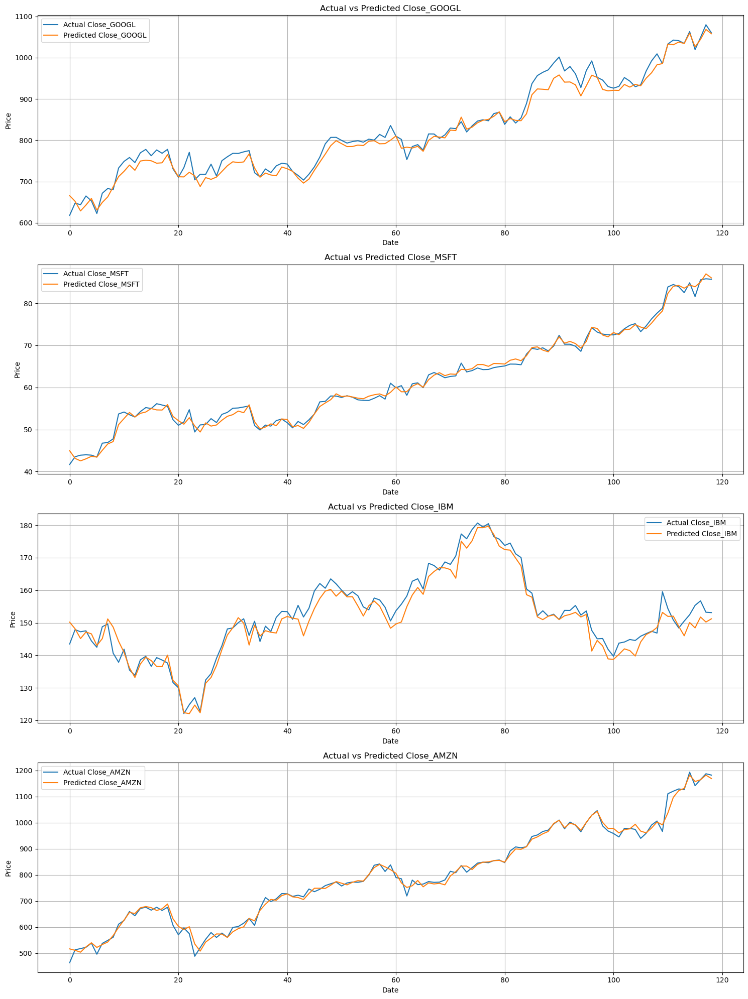

In [313]:
# Plotting the actual vs predicted values for all targets

num_targets = y_test_original.shape[1]
plt.figure(figsize=(15, 5 * num_targets))
for i in range(num_targets):
    plt.subplot(num_targets, 1, i + 1)
    plt.plot(y_test_original[:, i], label=f'Actual {target_stocks[i]}')
    plt.plot(y_pred_original[:, i], label=f'Predicted {target_stocks[i]}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.title(f'Actual vs Predicted {target_stocks[i]}')
    plt.legend()
    plt.grid(True)
plt.tight_layout()
plt.show()

## **4 Conclusion** <font color =red> [5 marks] </font>

### **4.1 Conclusion and insights** <font color =red> [5 marks] </font>

#### **4.1.1** <font color =red> [5 marks] </font>
Conclude with the insights drawn and final outcomes and results.

1. For both the cases (1- Single stock predictions and 2- Multiple stock predictions):
  - LSTM models were better (<font color = 'Red'> and very close to the actual values <font color = 'Black'>) in predictions with lower 'Mean Squared Error' (MSE).
  - The MSE for LSTM models was almost half of the SimpleRNN models..
    
2. GOOGL: The model captures the overall trend well but lags slightly during some volatile periods (noticeable deviations around peaks and valleys).

3. MSFT: Predictions are very close to actuals. Slight under-/overshoots exist, but overall the model fits extremely well.

4. IBM: Model captures broad trends but struggles during high fluctuations (ups and downs around points 20–80).

5. AMZN: The model tracks actual prices very closely, even during volatility.

